                       Churn Prediction Model
 Customer who are likely to churned out of the business.

 Customer churn or customer attrition refers to the loss of customers or subscribers for any reason at all. Businesses measure and track churn as a percentage of lost customers compared to total number of customers over a given time period.
 

Formula to calculate Churn Rate:
Churn Rate = Lost Customers ÷ Total Customers at the Start of Time Period) x 100

DATASET FEATURES :

1.CLIENTNUM - Client number. Unique identifier for the customer holding the account.
2.Attrition_Flag - Internal event (customer activity) variable - if the account is closed then 1 else 0.
3.Customer_Age -Demographic variable - Customer's Age in Years.
4.Gender - Demographic variable - M=Male, F=Female.
5.Dependent_count - Demographic variable - Number of dependents.
6.Education_Level - Demographic variable - Educational Qualification of the account holder (example: high school).
7.Marital_Status - Demographic variable - Married, Single, Divorced, Unknown.
8.Income_Category - Demographic variable - Annual Income Category of the account holder.
9.Card_Category - Product Variable - Type of Card (Blue, Silver, Gold, Platinum).
10.Months_on_book - Period of relationship with bank.
11.Total_Relationship_Count-Total no. of products held by the customer.
12.Months_Inactive_12_mon - No. of months inactive in the last 12 months.
13.Contacts_Count_12_mon-No. of Contacts in the last 12 months.
14.Credit_Limit-Credit Limit on the Credit Card.
15.Total_Revolving_Bal-Total Revolving Balance on the Credit Card.
16.Avg_Open_To_Buy-Open to Buy Credit Line (Average of last 12 months).
17.Total_Amt_Chng_Q4_Q1- Open to Buy Credit Line (Average of last 12 months).
18.Total_Trans_Amt-Total Transaction Amount (Last 12 months).
19.Total_Trans_Ct- Total Transaction Count (Last 12 months).
20.Total_Ct_Chng_Q4_Q1-Change in Transaction Count (Q4 over Q1).
21.Avg_Utilization_Ratio-Average Ca22.Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1
23.Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2rd Utilization Ratio.


Importing the Libraries

In [415]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler



Reading the data

In [416]:
dat = pd.read_csv("Bankchurners.csv")
dat.head() 

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,60K to 80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than 40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,80K to 120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than 40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,60K to 80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


EDA

In [417]:
dat.shape

(10127, 23)

In [418]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [419]:
dat.isnull().sum()   

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

In [420]:
dat.dtypes 

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

In [421]:
dat.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.159997,0.840003
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.365301,0.365301
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000008,0.000420
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,0.000099,0.999660
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,0.000181,0.999820
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,0.000337,0.999900
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,0.999580,0.999990


In [422]:
round(dat.describe(exclude = 'object'), 2)

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
count,1.012700e+04,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00
mean,7.391776e+08,46.33,2.35,35.93,3.81,2.34,2.46,8631.95,1162.81,7469.14,0.76,4404.09,64.86,0.71,0.27,0.16,0.84
std,3.690378e+07,8.02,1.30,7.99,1.55,1.01,1.11,9088.78,814.99,9090.69,0.22,3397.13,23.47,0.24,0.28,0.37,0.37
min,7.080821e+08,26.00,0.00,13.00,1.00,0.00,0.00,1438.30,0.00,3.00,0.00,510.00,10.00,0.00,0.00,0.00,0.00
25%,7.130368e+08,41.00,1.00,31.00,3.00,2.00,2.00,2555.00,359.00,1324.50,0.63,2155.50,45.00,0.58,0.02,0.00,1.00
50%,7.179264e+08,46.00,2.00,36.00,4.00,2.00,2.00,4549.00,1276.00,3474.00,0.74,3899.00,67.00,0.70,0.18,0.00,1.00
75%,7.731435e+08,52.00,3.00,40.00,5.00,3.00,3.00,11067.50,1784.00,9859.00,0.86,4741.00,81.00,0.82,0.50,0.00,1.00
max,8.283431e+08,73.00,5.00,56.00,6.00,6.00,6.00,34516.00,2517.00,34516.00,3.40,18484.00,139.00,3.71,1.00,1.00,1.00


In [423]:
round(dat.describe(exclude = ['float', 'int64']))  

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,10127,10127,10127,10127
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than 40K,Blue
freq,8500,5358,3128,4687,3561,9436


In [424]:
dat.CLIENTNUM.nunique()

10127

In [425]:
dat.CLIENTNUM.unique()

array([768805383, 818770008, 713982108, ..., 716506083, 717406983,
       714337233], dtype=int64)

In [426]:
dat.size

232921

In [427]:
dat.ndim

2

In [428]:
dat.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

To Visualize the missing data

In [429]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


<Axes: >

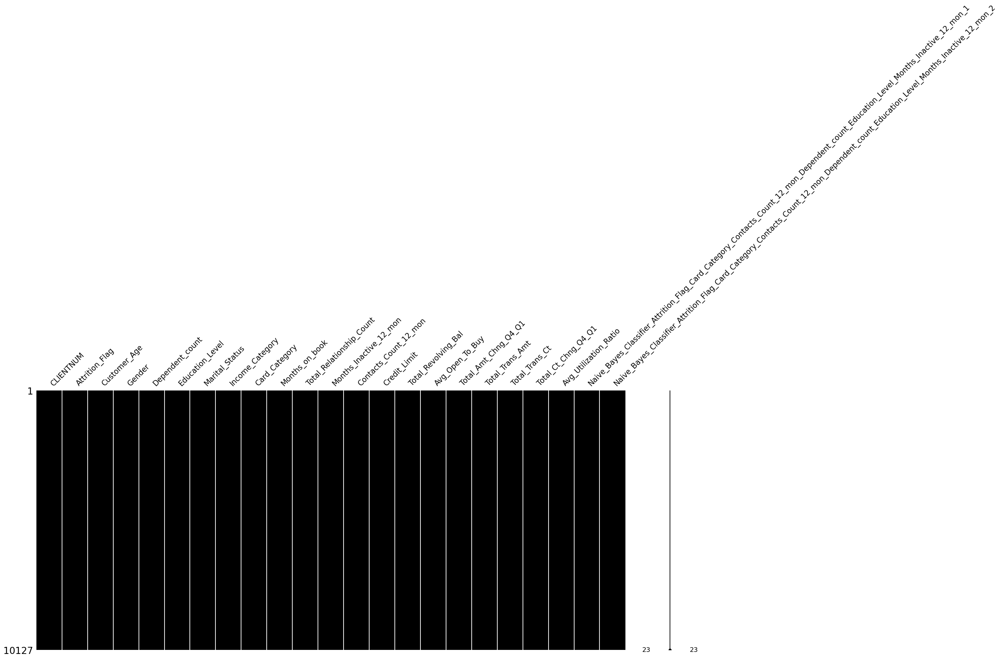

In [430]:
import missingno as mn  # Visualizing the missing values
mn.matrix(dat,color=(0,0,0))

No. Of Customer who are existing and Churned Out(Target Variable)

In [431]:
dat.Attrition_Flag.value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

Encoding the Target Variable

In [432]:
dat["Attrition_Flag"] = dat["Attrition_Flag"].map({"Existing Customer":0, "Attrited Customer":1})


In [433]:
dat.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,0,45,M,3,High School,Married,60K to 80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,0,49,F,5,Graduate,Single,Less than 40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,0,51,M,3,Graduate,Married,80K to 120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,0,40,F,4,High School,Unknown,Less than 40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,0,40,M,3,Uneducated,Married,60K to 80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


Detecting Outliers

In [434]:
continuous_feature = [feature for feature in dat.columns if dat[feature].dtypes !='0']
colors = ['#0000FF'] 

Distribution of the data

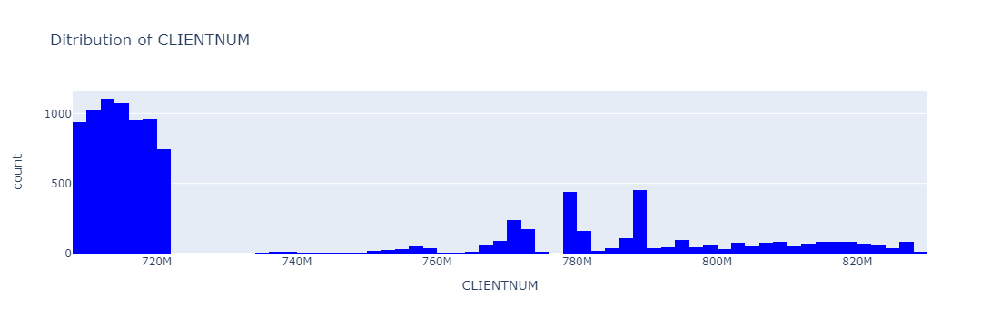

Skewness: 1.848449
Kurtosis: 1.417043


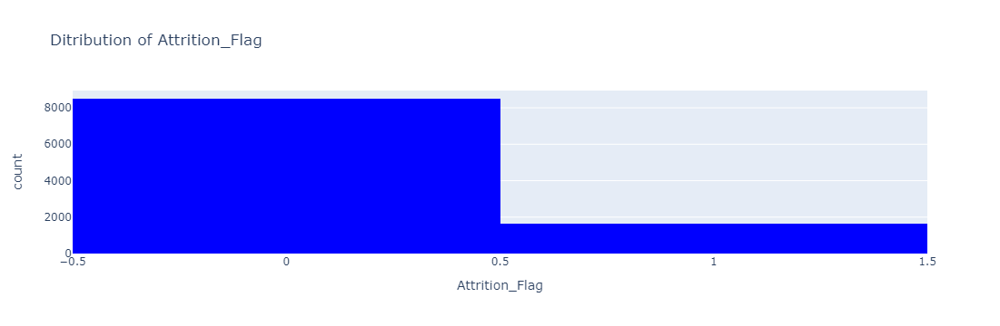

Skewness: 1.848449
Kurtosis: 1.417043


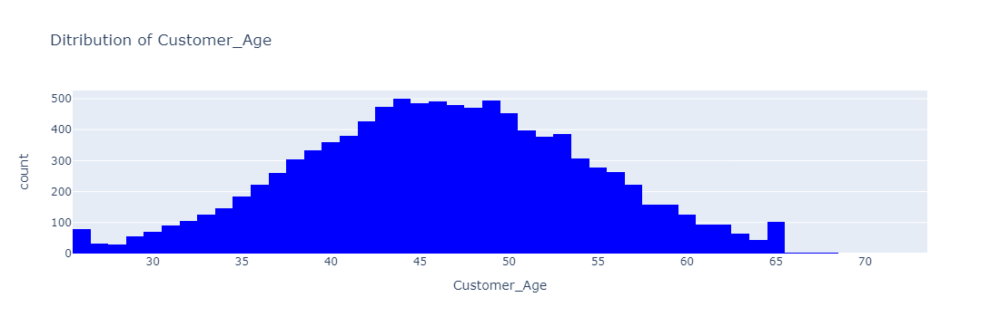

Skewness: 1.848449
Kurtosis: 1.417043


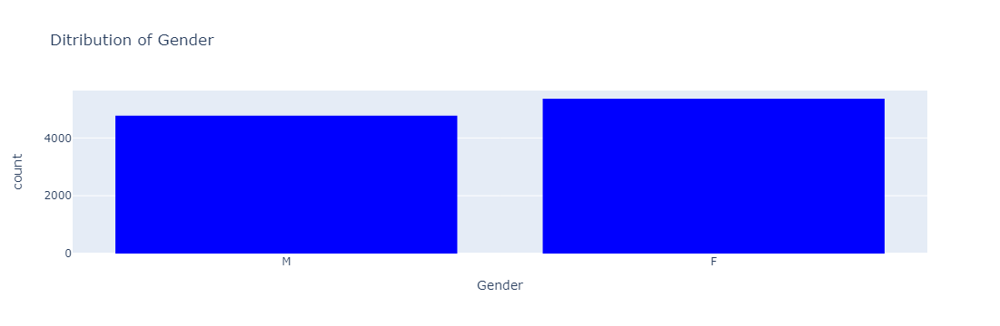

Skewness: 1.848449
Kurtosis: 1.417043


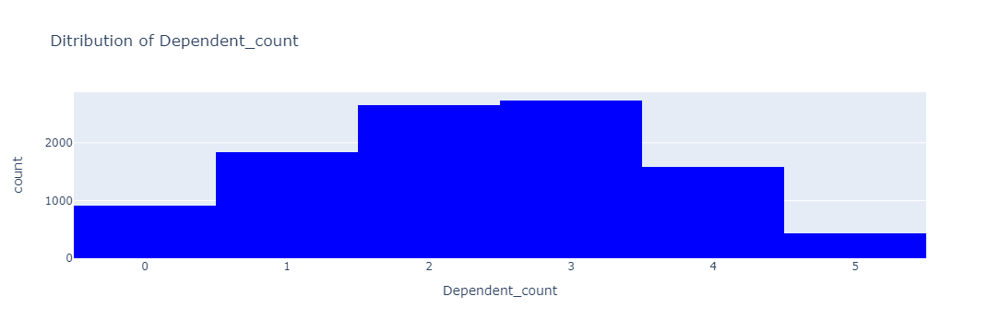

Skewness: 1.848449
Kurtosis: 1.417043


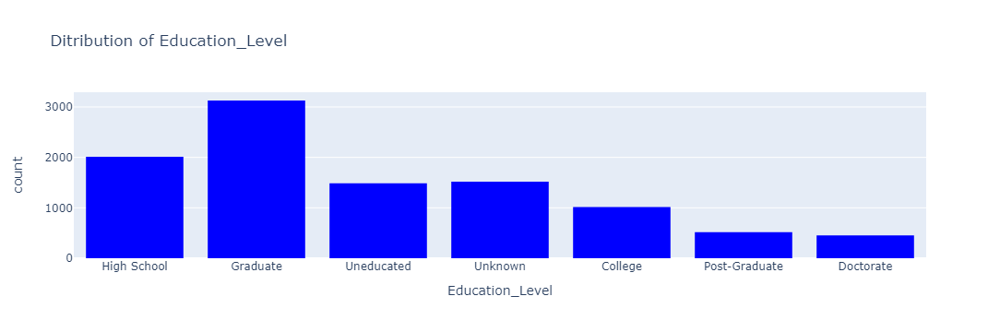

Skewness: 1.848449
Kurtosis: 1.417043


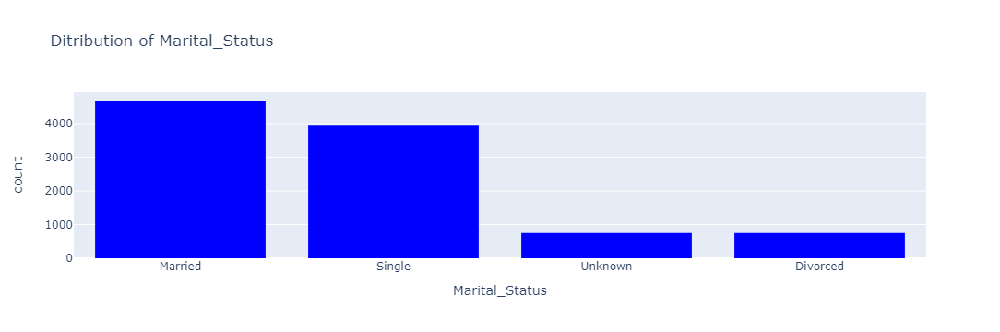

Skewness: 1.848449
Kurtosis: 1.417043


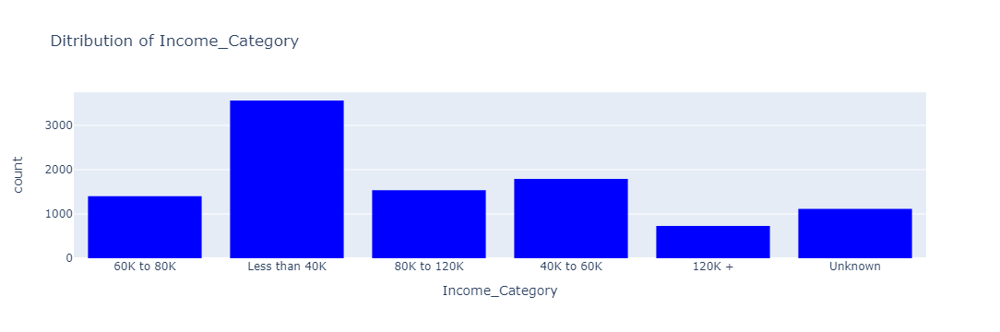

Skewness: 1.848449
Kurtosis: 1.417043


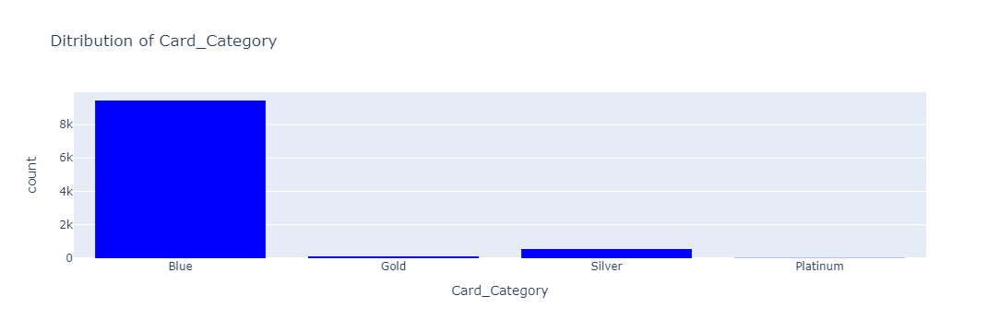

Skewness: 1.848449
Kurtosis: 1.417043


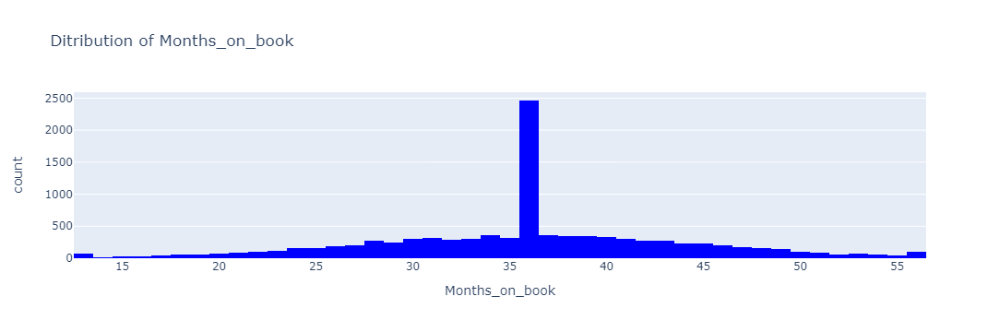

Skewness: 1.848449
Kurtosis: 1.417043


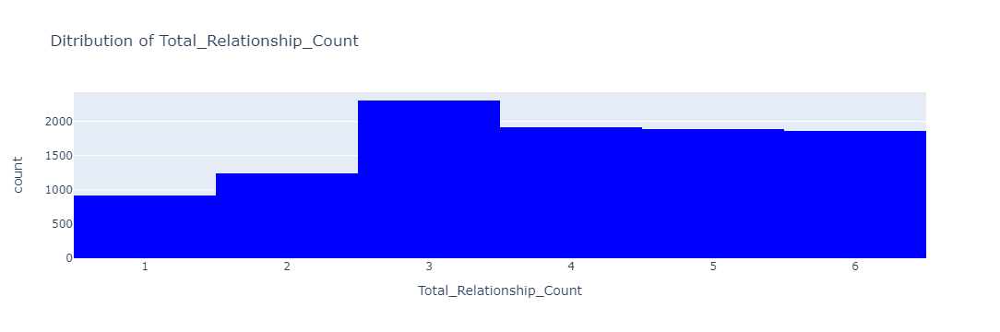

Skewness: 1.848449
Kurtosis: 1.417043


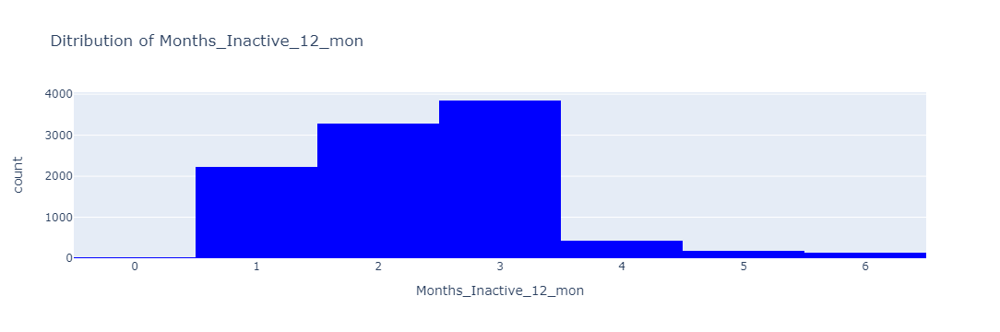

Skewness: 1.848449
Kurtosis: 1.417043


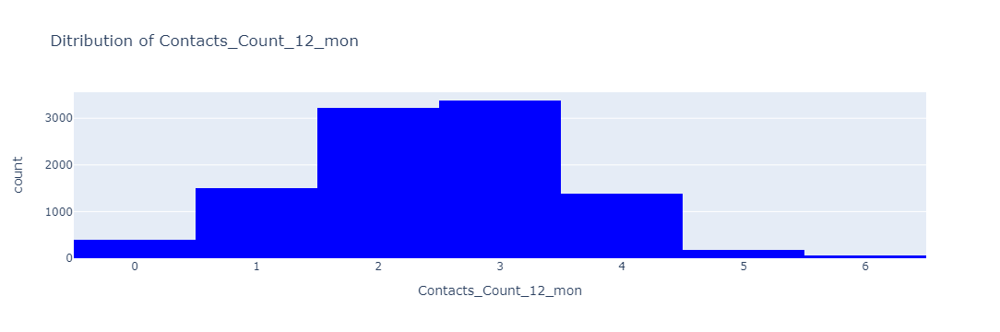

Skewness: 1.848449
Kurtosis: 1.417043


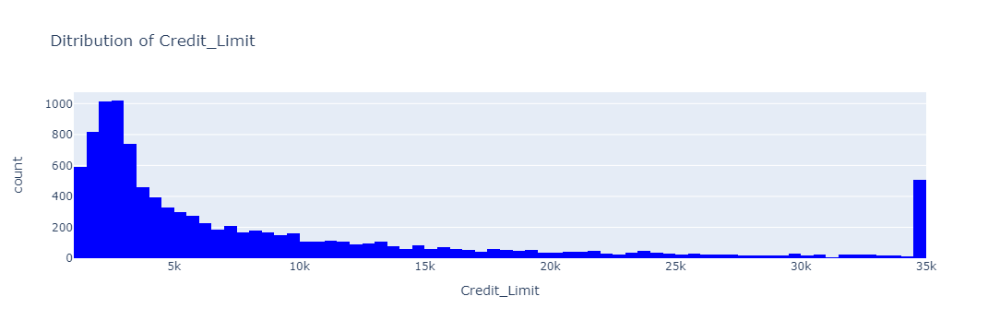

Skewness: 1.848449
Kurtosis: 1.417043


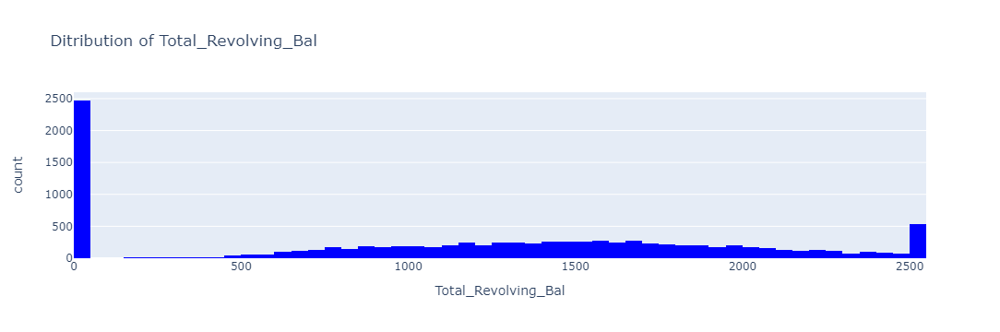

Skewness: 1.848449
Kurtosis: 1.417043


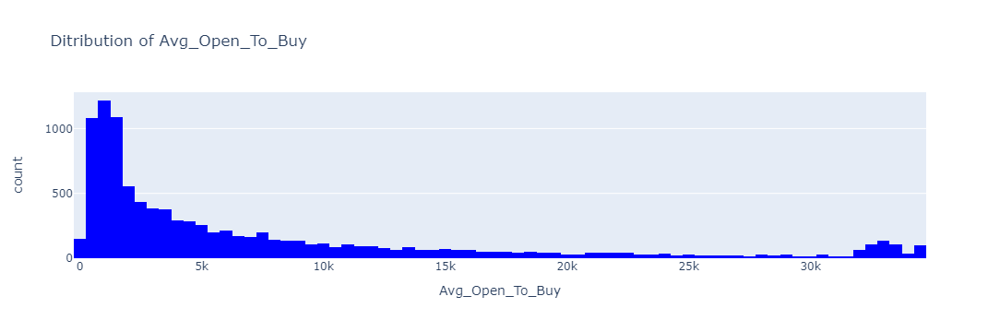

Skewness: 1.848449
Kurtosis: 1.417043


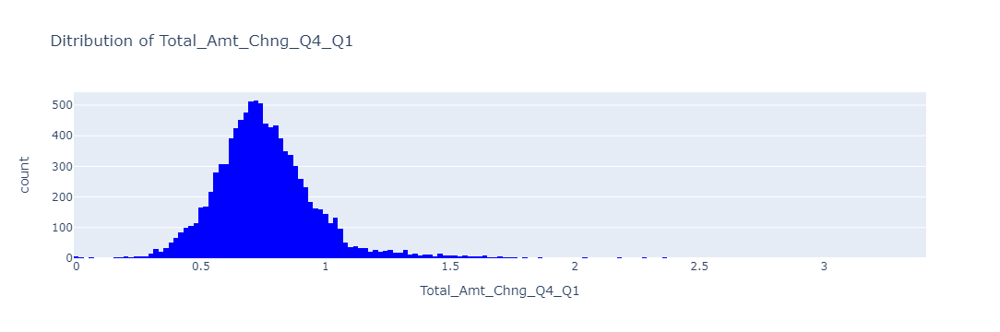

Skewness: 1.848449
Kurtosis: 1.417043


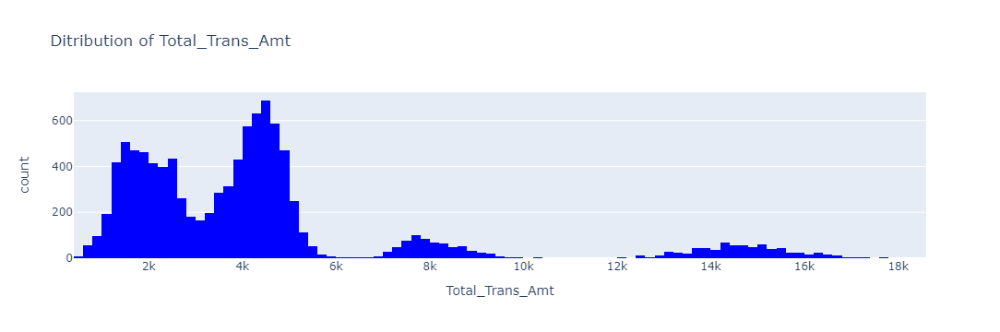

Skewness: 1.848449
Kurtosis: 1.417043


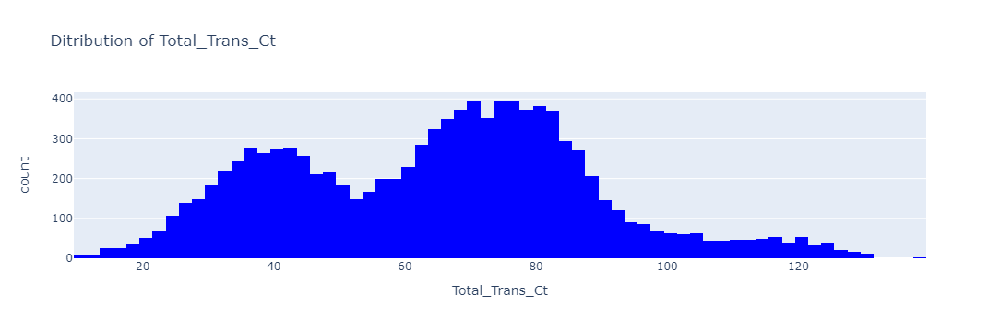

Skewness: 1.848449
Kurtosis: 1.417043


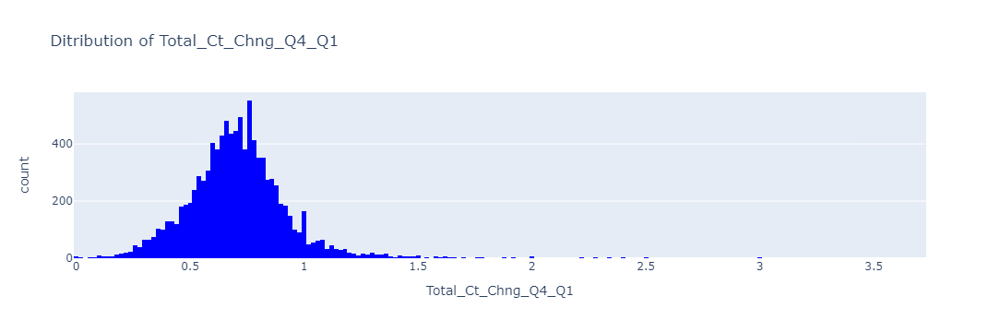

Skewness: 1.848449
Kurtosis: 1.417043


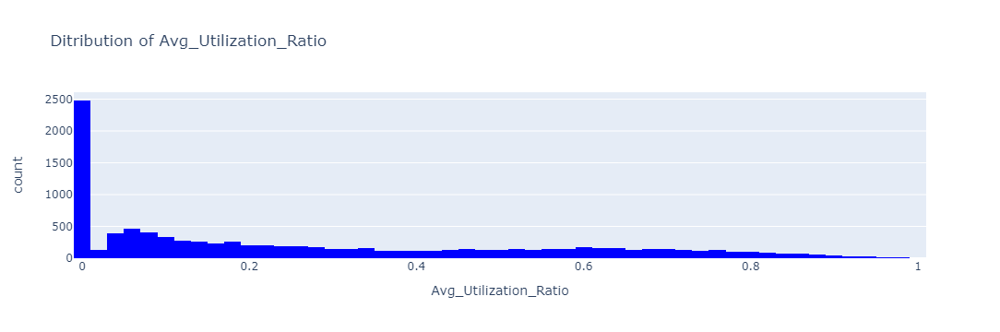

Skewness: 1.848449
Kurtosis: 1.417043


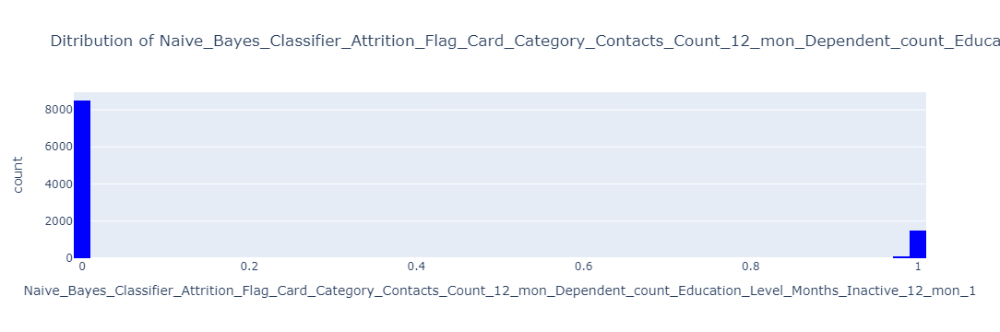

Skewness: 1.848449
Kurtosis: 1.417043


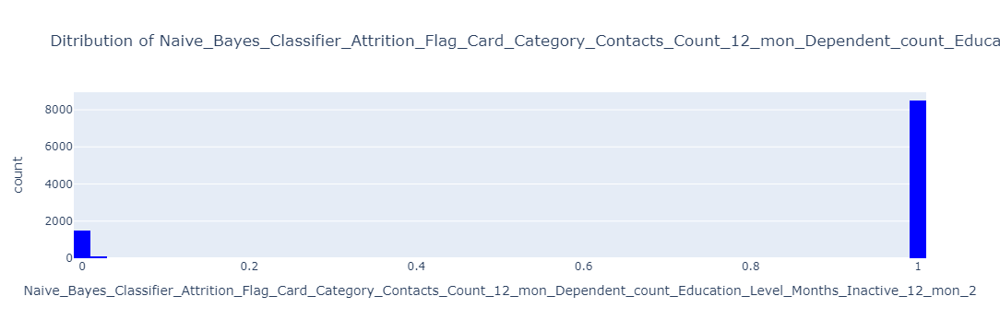

Skewness: 1.848449
Kurtosis: 1.417043


In [435]:
for feature in continuous_feature:
  d = dat.copy()
  figure = px.histogram(dat, x = feature, title = 'Ditribution of ' +feature,color_discrete_sequence= colors)
  figure.show()
  print("Skewness: %f" % dat['Attrition_Flag'].skew())
  print("Kurtosis: %f" % dat['Attrition_Flag'].kurt())

Numerical Analysis

In [436]:
numerical_features = [feature for feature in dat.columns if dat[feature].dtypes!= 'O']

print('Number of numerical variables: ', len(numerical_features))
print('\n')
print('Numerical Variables Columns: ',numerical_features)
print('\n')
dat[numerical_features].head()  #set_properties font,size, background color

Number of numerical variables:  18


Numerical Variables Columns:  ['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']




,CLIENTNUM,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,0,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,0,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,0,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,0,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


Attrition Flag

In [437]:
from IPython.core.display import HTML
def multi_table(table_list):
  '''Acceps a list of IpyTable objects and returns a table which contains each IpyTable in a cell
  '''
  return HTML(
      '<table><tr style="background-color:white;">' +  
      ''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list]) +
      '</tr></table>')

In [438]:
dat_nunique = {var: pd.DataFrame(dat['Attrition_Flag'].value_counts())
              for var in {'Attrition_Flag'}}
multi_table([ dat_nunique['Attrition_Flag'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Attrition_Flag,
0,8500
1,1627


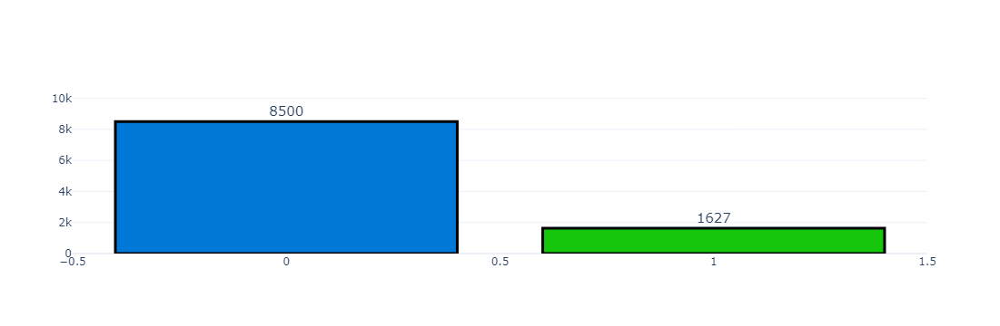

In [439]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#f0f87f']
figure.add_trace(go.Bar(y = dat['Attrition_Flag'].value_counts().values.tolist(), 
                      x = dat['Attrition_Flag'].value_counts().index, 
                      text=dat['Attrition_Flag'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                              line_width=3)),row = 1,col = 1)
figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,10500])
iplot(figure)

Customer Age

In [440]:
dat_nunique = {var: pd.DataFrame(dat['Customer_Age'].value_counts())
              for var in {'Customer_Age'}}
multi_table([ dat_nunique['Customer_Age'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Customer_Age,
44,500
49,495
46,490
45,486
47,479
43,473
48,472
50,452
42,426


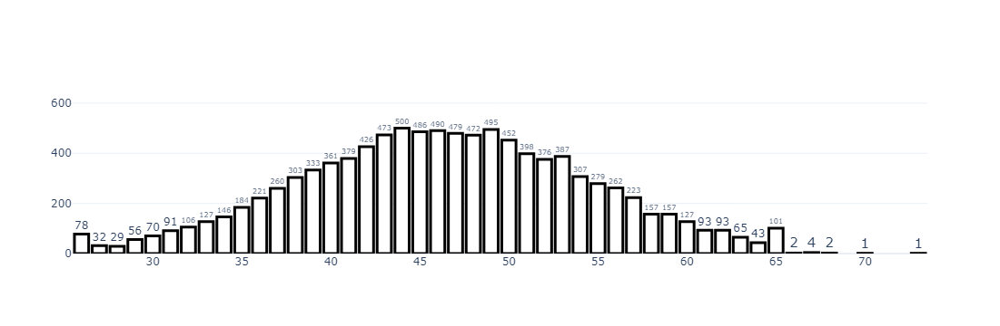

In [441]:
figure = make_subplots(rows=1,cols=1)
figure.add_trace(go.Bar(y = dat['Customer_Age'].value_counts().values.tolist(), 
                      x = dat['Customer_Age'].value_counts().index, 
                      text=dat['Customer_Age'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = 'white',
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,650])
iplot(figure)

In [442]:
dat['Age']=0
dat.loc[(dat['Customer_Age']>25)&(dat['Customer_Age']<=35),'Age']=0
dat.loc[(dat['Customer_Age']>35)&(dat['Customer_Age']<=45),'Age']=1
dat.loc[(dat['Customer_Age']>45)&(dat['Customer_Age']<=55),'Age']=2
dat.loc[(dat['Customer_Age']>55)&(dat['Customer_Age']<=65),'Age']=3
dat.loc[dat['Customer_Age']>65,'Age']=4
dat['Age']=dat['Age'].astype(int)

In [443]:
dat.drop(['Customer_Age'],axis = 1,inplace = True)

In [444]:
dat_nunique = {var: pd.DataFrame(dat['Age'].value_counts()) 
              for var in {'Age'}}
multi_table([ dat_nunique['Age'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Age,
2,4135
1,3742
3,1321
0,919
4,10


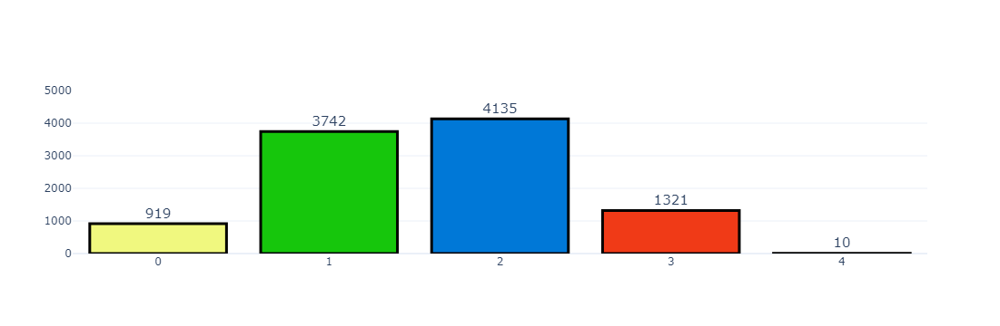

In [445]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#f0f87f']
figure.add_trace(go.Bar(y = dat['Age'].value_counts().values.tolist(), 
                      x = dat['Age'].value_counts().index, 
                      text=dat['Age'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                              line_width=3)),row = 1,col = 1)
figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,5000])
iplot(figure)

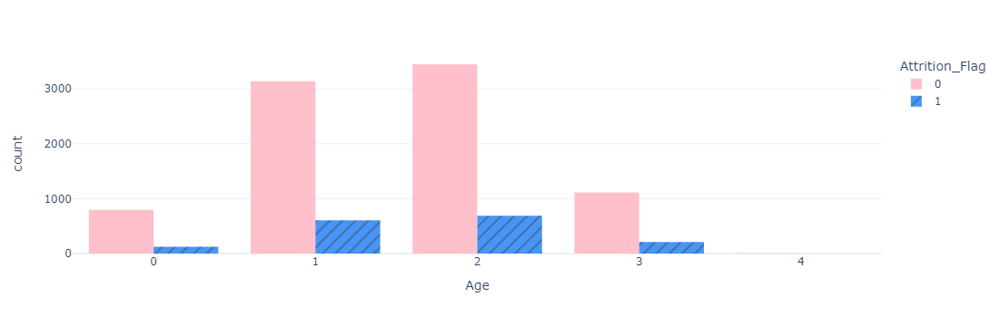

In [446]:
figure = px.histogram(dat, x="Age", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#FFC0CB",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

Dependent Count

In [447]:
dat_nunique = {var: pd.DataFrame(dat['Dependent_count'].value_counts()) 
              for var in {'Dependent_count'}}
multi_table([ dat_nunique['Dependent_count'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Dependent_count,
3,2732
2,2655
1,1838
4,1574
0,904
5,424


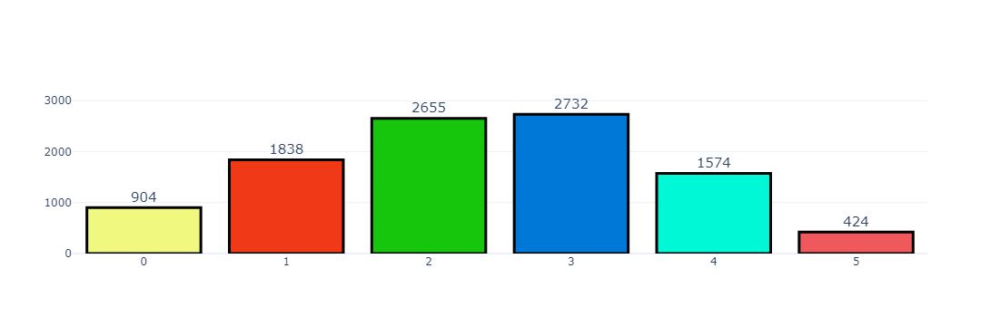

In [448]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Dependent_count'].value_counts().values.tolist(), 
                      x = dat['Dependent_count'].value_counts().index, 
                      text=dat['Dependent_count'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,3200])
iplot(figure)

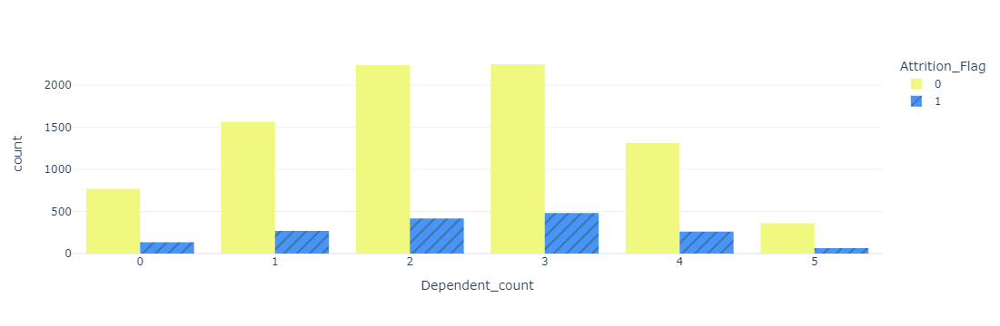

In [449]:
figure = px.histogram(dat, x="Dependent_count", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

Months on book

In [450]:
dat_nunique = {var: pd.DataFrame(dat['Months_on_book'].value_counts()) 
              for var in {'Months_on_book'}}
multi_table([ dat_nunique['Months_on_book'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Months_on_book,
36,2463
37,358
34,353
38,347
39,341
40,333
31,318
35,317
33,305


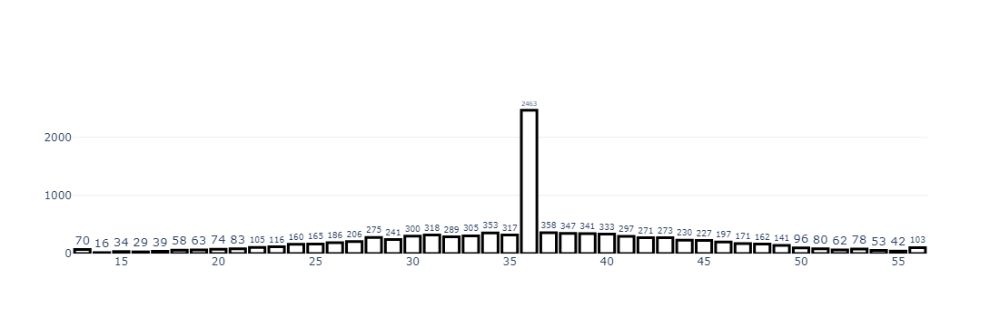

In [451]:
figure = make_subplots(rows=1,cols=1)
figure.add_trace(go.Bar(y = dat['Months_on_book'].value_counts().values.tolist(), 
                      x = dat['Months_on_book'].value_counts().index, 
                      text=dat['Months_on_book'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = 'white',
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,2800])
iplot(figure)

Bank Relationship Period

In [452]:
dat['Bank_Relationship_Period']=0
dat.loc[(dat['Months_on_book']>=0)&(dat['Months_on_book']<=10),'Bank_Relationship_Period']=0
dat.loc[(dat['Months_on_book']>10)&(dat['Months_on_book']<=20),'Bank_Relationship_Period']=1
dat.loc[(dat['Months_on_book']>20)&(dat['Months_on_book']<=30),'Bank_Relationship_Period']=2
dat.loc[(dat['Months_on_book']>30)&(dat['Months_on_book']<=40),'Bank_Relationship_Period']=3
dat.loc[dat['Months_on_book']>50,'Bank_Relationship_Period']=4

In [453]:
dat['Bank_Relationship_Period']=dat['Bank_Relationship_Period'].astype(int)

In [454]:
dat.drop(['Months_on_book'],axis = 1,inplace = True)

In [455]:
dat_nunique = {var: pd.DataFrame(dat['Bank_Relationship_Period'].value_counts()) 
              for var in {'Bank_Relationship_Period'}}
multi_table([ dat_nunique['Bank_Relationship_Period'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Bank_Relationship_Period,
3,5424
0,2065
2,1837
4,418
1,383


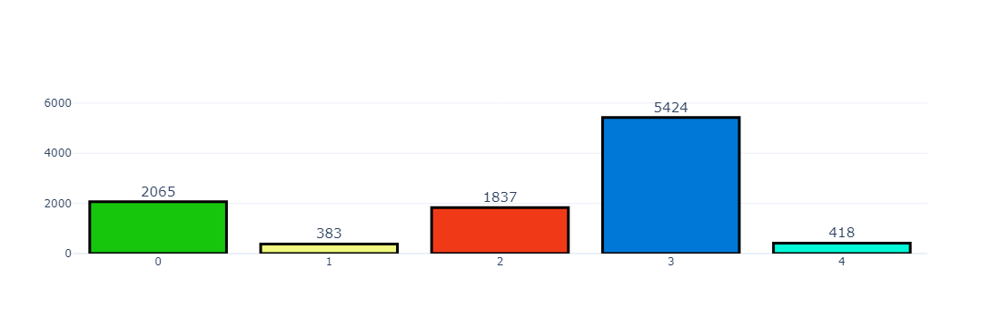

In [456]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f']
figure.add_trace(go.Bar(y = dat['Bank_Relationship_Period'].value_counts().values.tolist(), 
                      x = dat['Bank_Relationship_Period'].value_counts().index, 
                      text=dat['Bank_Relationship_Period'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,6500])
iplot(figure)

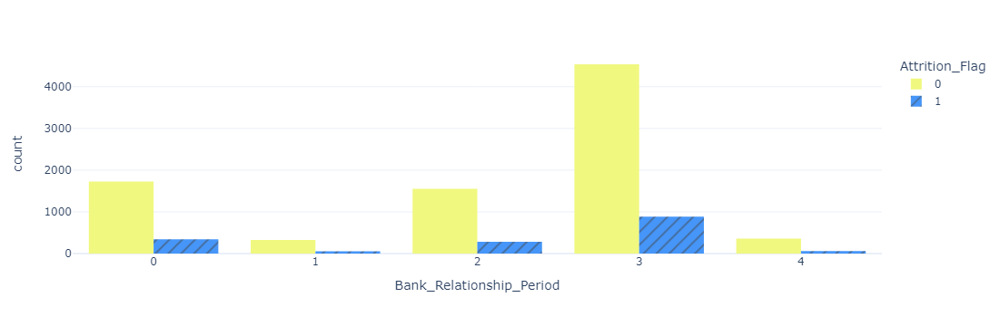

In [457]:
figure = px.histogram(dat, x="Bank_Relationship_Period", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

Total Relationship Count

In [458]:
dat_nunique = {var: pd.DataFrame(dat['Total_Relationship_Count'].value_counts()) 
              for var in {'Total_Relationship_Count'}}
multi_table([ dat_nunique['Total_Relationship_Count'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Total_Relationship_Count,
3,2305
4,1912
5,1891
6,1866
2,1243
1,910


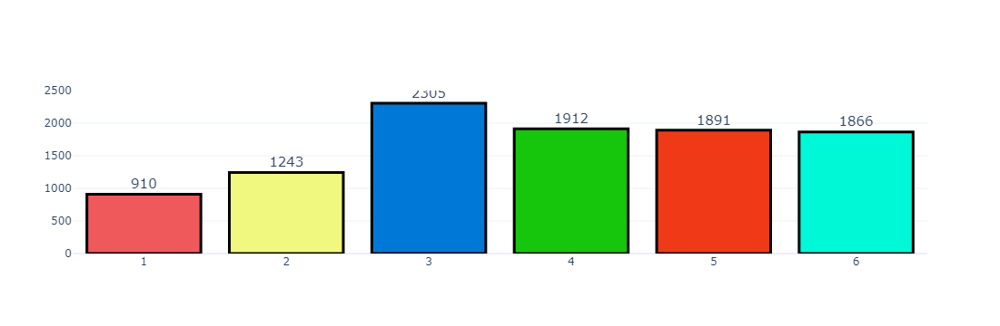

In [459]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Total_Relationship_Count'].value_counts().values.tolist(), 
                      x = dat['Total_Relationship_Count'].value_counts().index, 
                      text=dat['Total_Relationship_Count'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,2500])
iplot(figure)

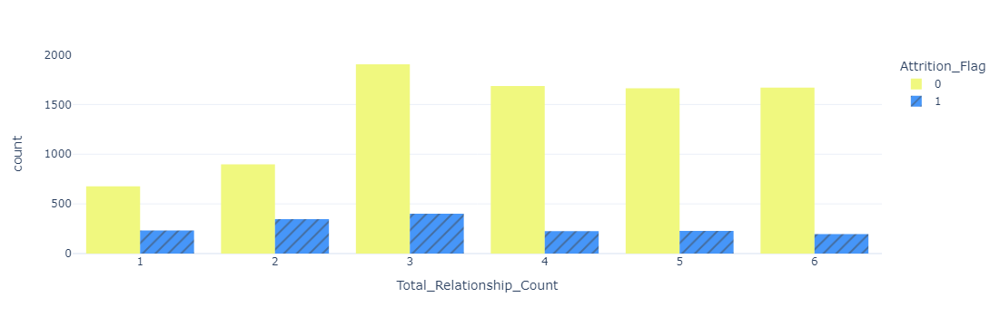

In [460]:
figure = px.histogram(dat, x="Total_Relationship_Count", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()


The Months Inactive 12 mon

In [461]:
dat_nunique = {var: pd.DataFrame(dat['Months_Inactive_12_mon'].value_counts()) 
              for var in {'Months_Inactive_12_mon'}}
multi_table([dat_nunique['Months_Inactive_12_mon'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Months_Inactive_12_mon,
3,3846
2,3282
1,2233
4,435
5,178
6,124
0,29


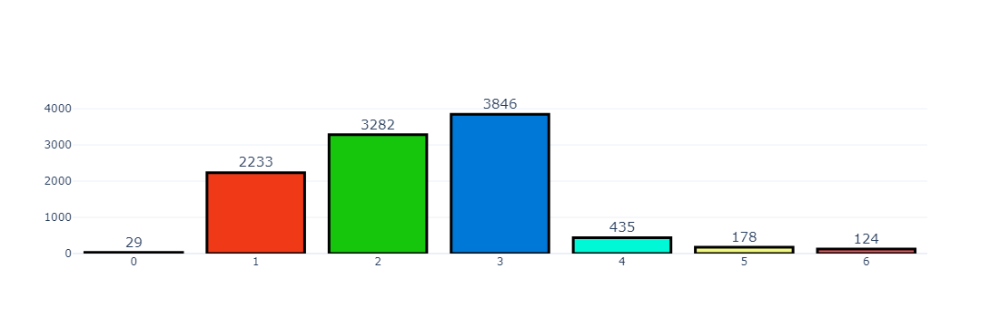

In [462]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Months_Inactive_12_mon'].value_counts().values.tolist(), 
                      x = dat['Months_Inactive_12_mon'].value_counts().index, 
                      text=dat['Months_Inactive_12_mon'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,4500])
iplot(figure)

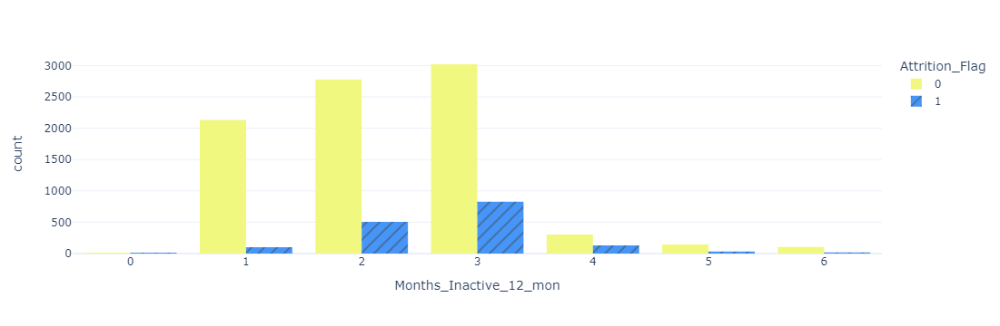

In [463]:
figure = px.histogram(dat, x="Months_Inactive_12_mon", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Contacts Count 12 mon

In [464]:
dat_nunique = {var: pd.DataFrame(dat['Contacts_Count_12_mon'].value_counts()) 
              for var in {'Contacts_Count_12_mon'}}
multi_table([ dat_nunique['Contacts_Count_12_mon'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Contacts_Count_12_mon,
3,3380
2,3227
1,1499
4,1392
0,399
5,176
6,54


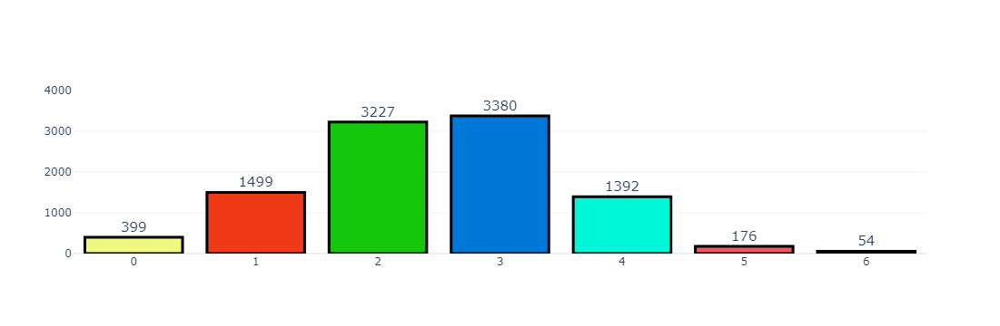

In [465]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Contacts_Count_12_mon'].value_counts().values.tolist(), 
                      x = dat['Contacts_Count_12_mon'].value_counts().index, 
                      text=dat['Contacts_Count_12_mon'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,4000])
iplot(figure)

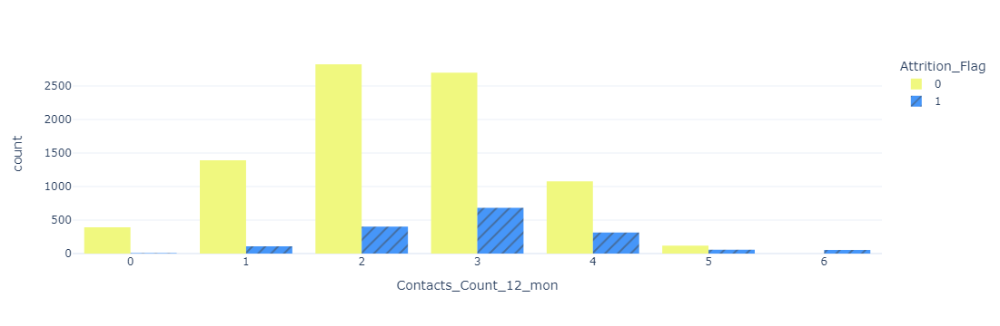

In [466]:
figure = px.histogram(dat, x="Contacts_Count_12_mon", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Credit Limit

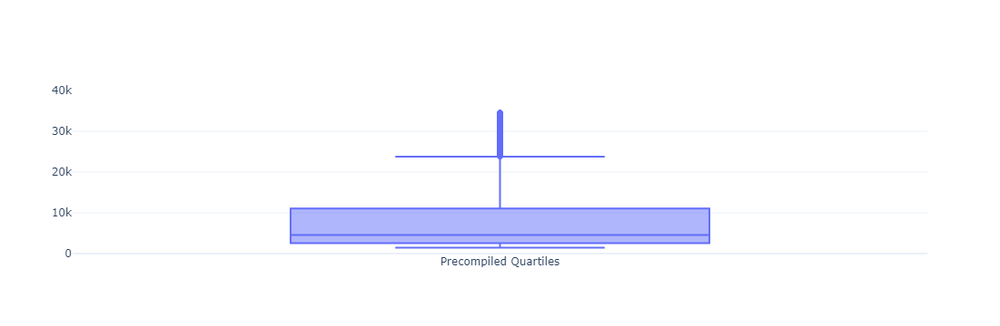

In [467]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Credit_Limit']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,40000])

iplot(figure)

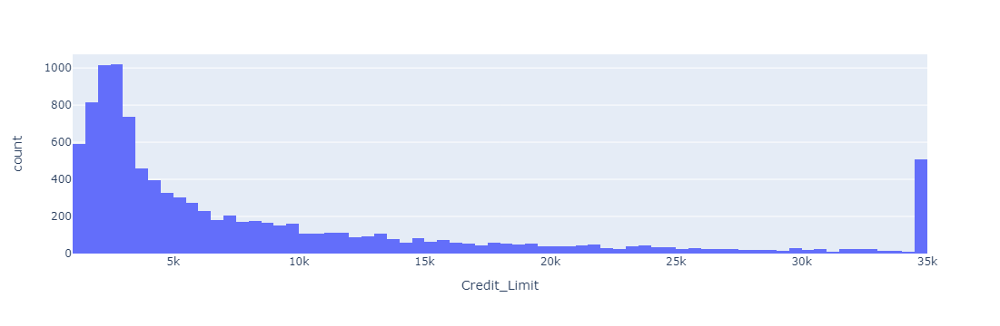

In [468]:
figure = px.histogram(dat, x="Credit_Limit")
figure.show()

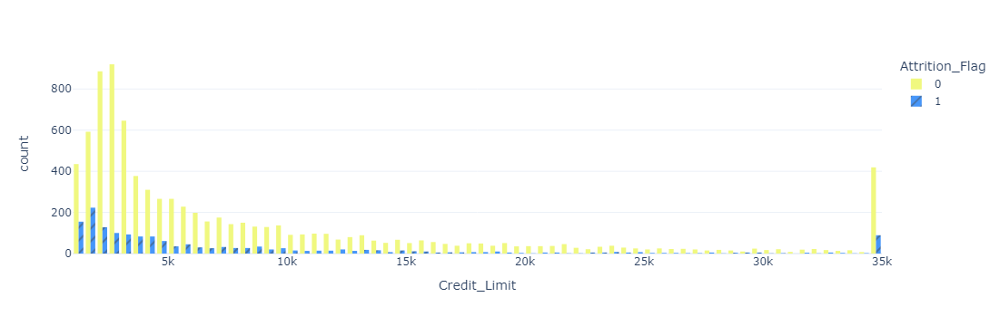

In [469]:
figure = px.histogram(dat, x="Credit_Limit", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Total Revolving Bal

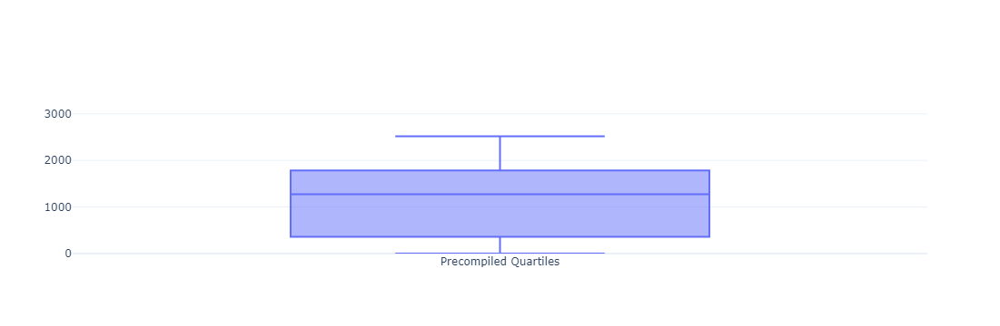

In [470]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Total_Revolving_Bal']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,3500])
iplot(figure)

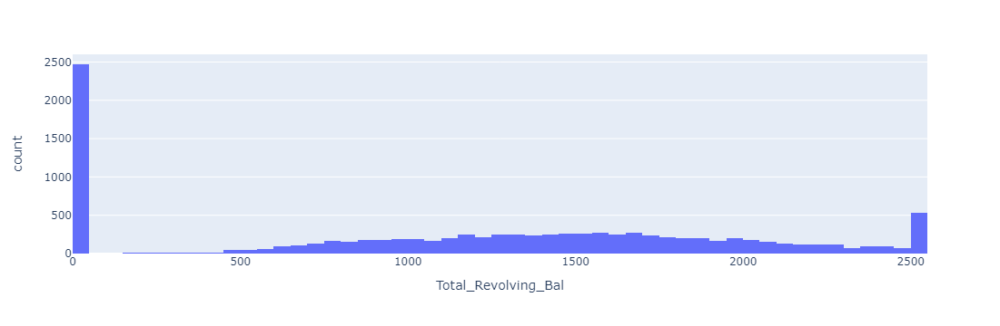

In [471]:
figure = px.histogram(dat, x="Total_Revolving_Bal")
figure.show()

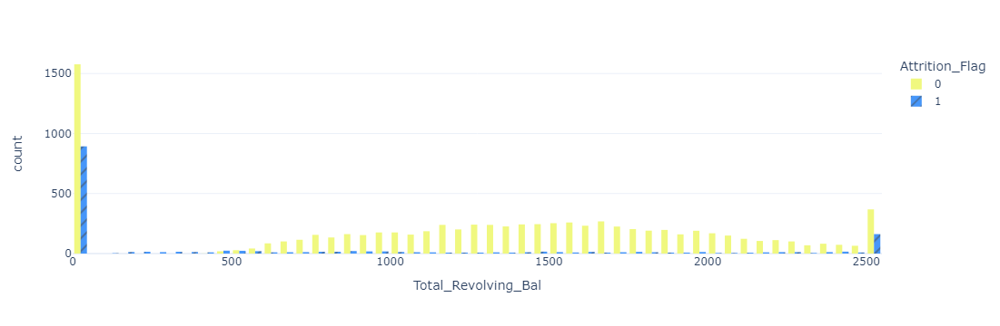

In [472]:
figure = px.histogram(dat, x="Total_Revolving_Bal", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Avg Open To Buy

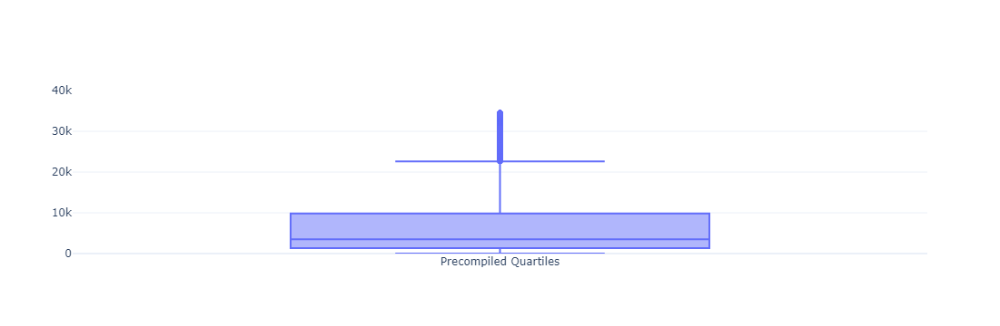

In [473]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Avg_Open_To_Buy']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,40000])
iplot(figure)

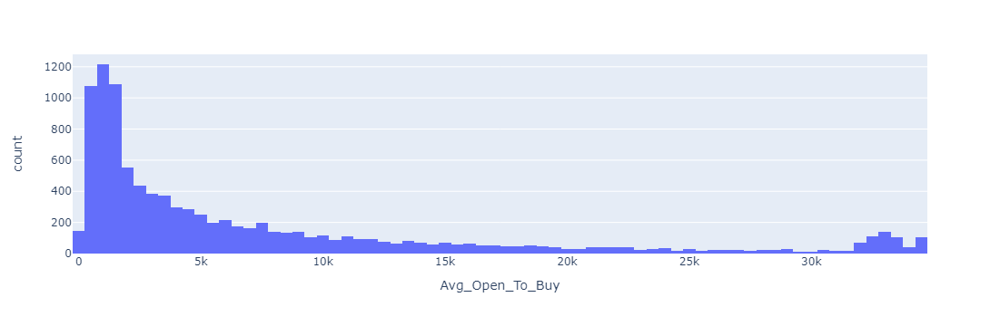

In [474]:
figure = px.histogram(dat, x="Avg_Open_To_Buy")
figure.show()

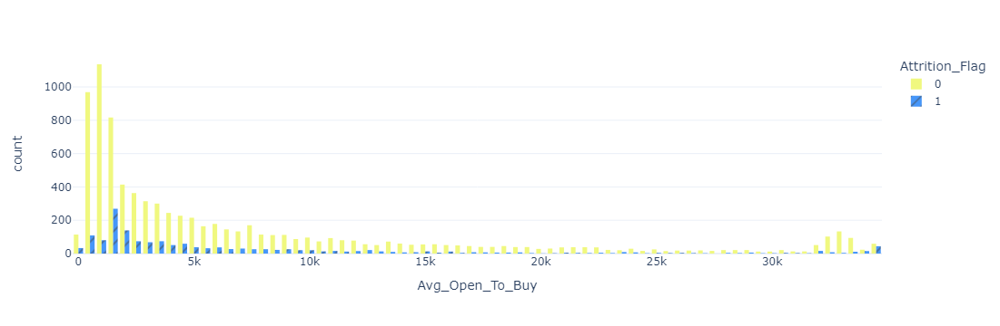

In [475]:
figure = px.histogram(dat, x="Avg_Open_To_Buy", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Total Amt Change Q4 Q1

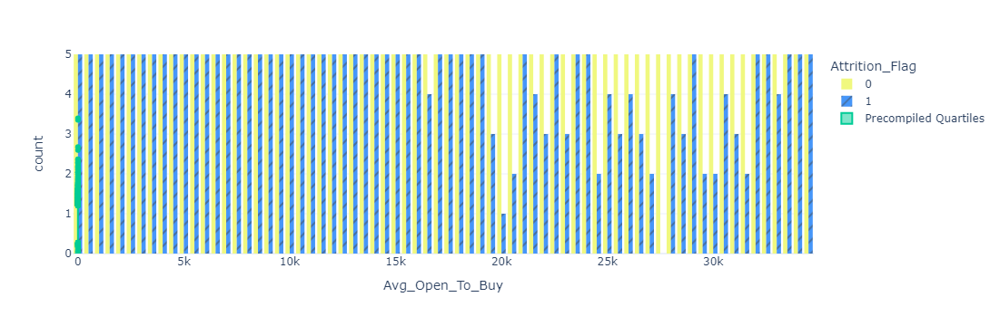

In [476]:
figure.add_trace(go.Box(y=dat['Total_Amt_Chng_Q4_Q1']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,5])
iplot(figure)

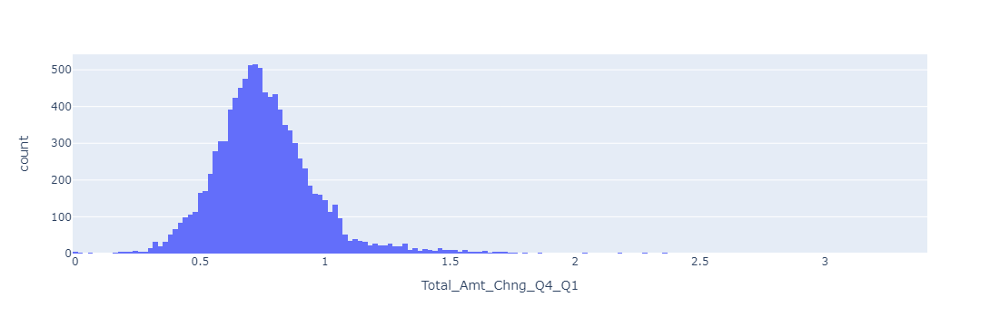

In [477]:
figure = px.histogram(dat, x="Total_Amt_Chng_Q4_Q1")
figure.show()

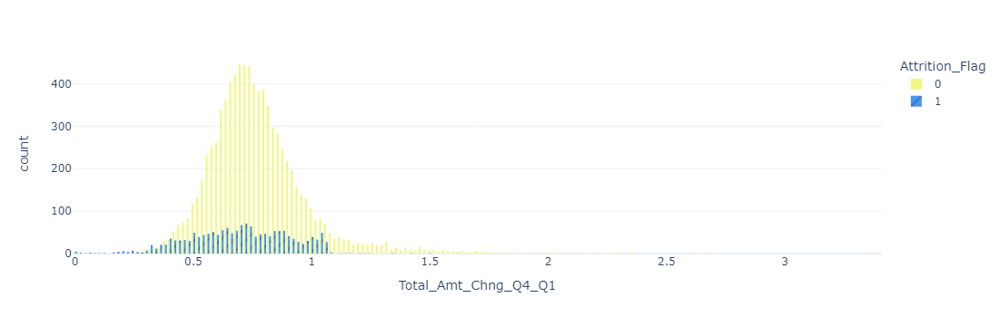

In [478]:
figure = px.histogram(dat, x="Total_Amt_Chng_Q4_Q1", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Total Trans Amt

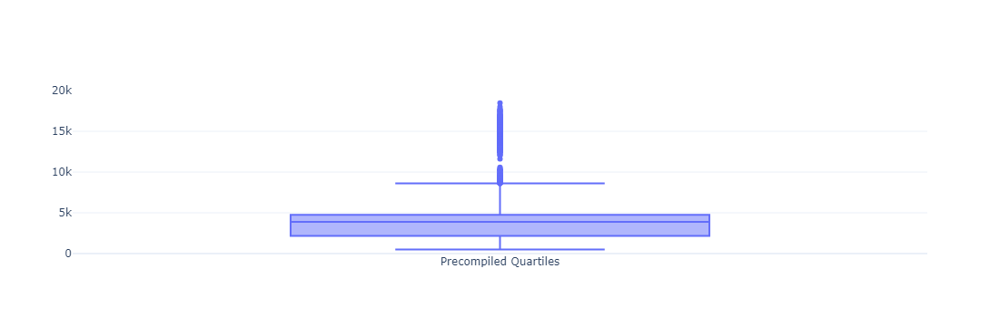

In [479]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Total_Trans_Amt']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,20000])
iplot(figure)

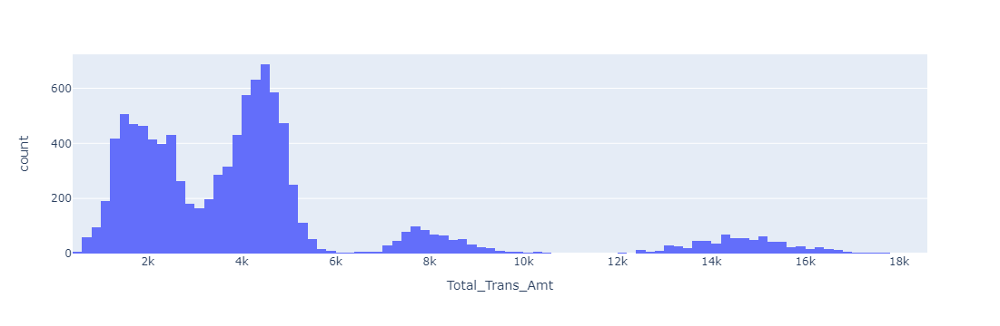

In [480]:
figure = px.histogram(dat, x="Total_Trans_Amt")
figure.show()

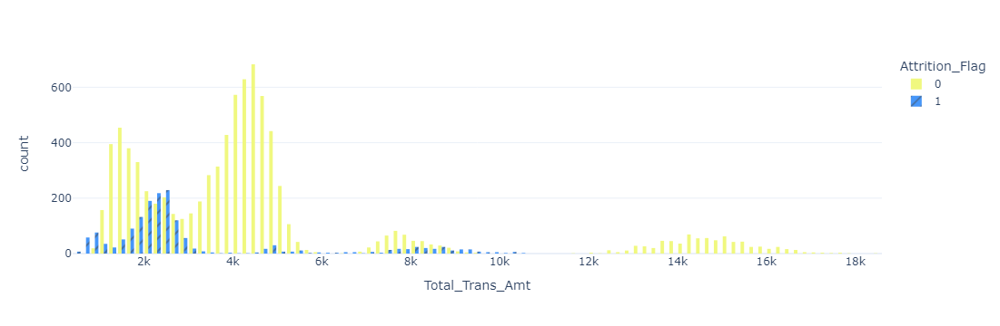

In [481]:
figure = px.histogram(dat, x="Total_Trans_Amt", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Total Trans Ct

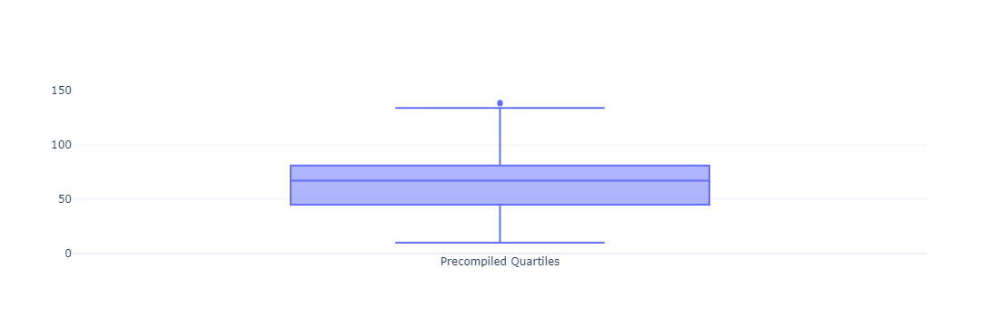

In [482]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Total_Trans_Ct']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,150])
iplot(figure)

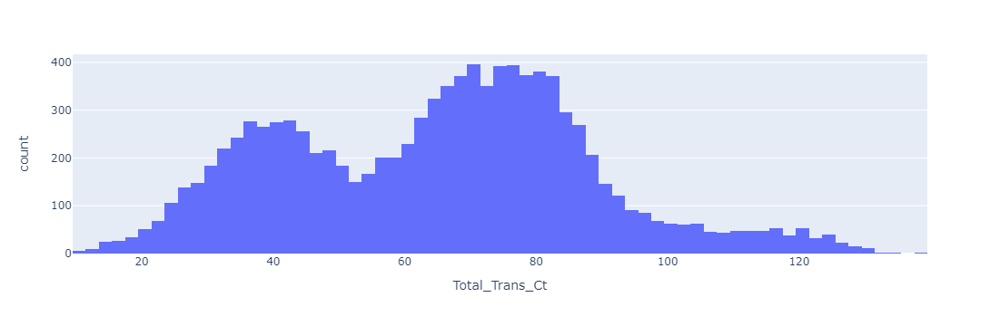

In [483]:
figure = px.histogram(dat, x="Total_Trans_Ct")
figure.show()

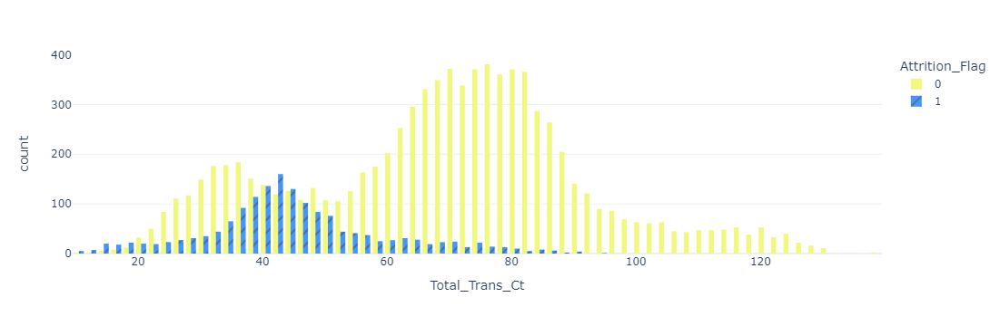

In [484]:
figure = px.histogram(dat, x="Total_Trans_Ct", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Total Ct Chng Q4 Q1

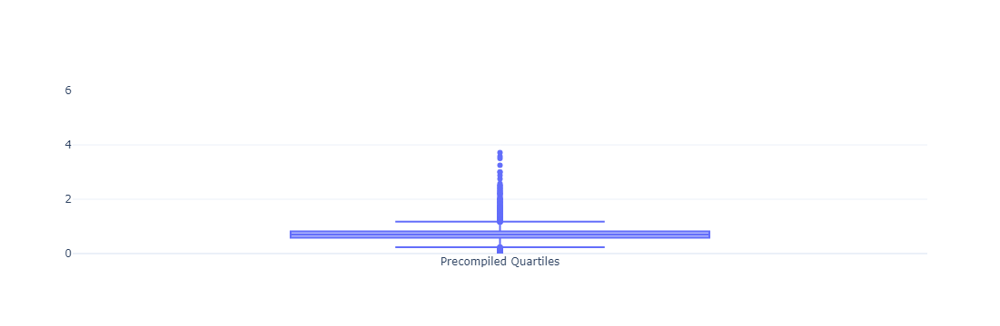

In [485]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Total_Ct_Chng_Q4_Q1']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,6])
iplot(figure)

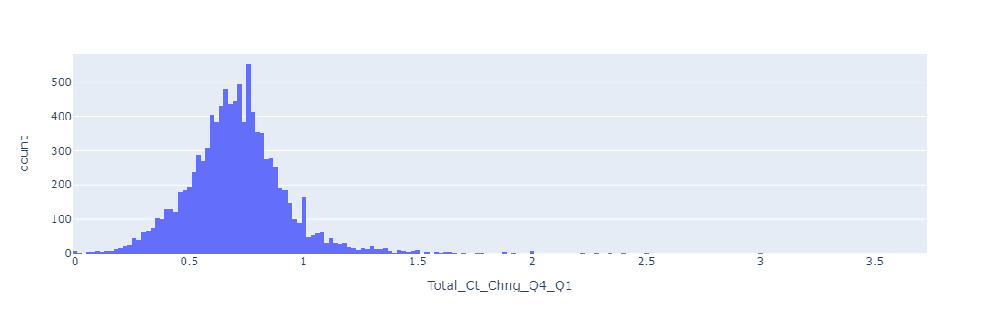

In [486]:
figure = px.histogram(dat, x="Total_Ct_Chng_Q4_Q1")
figure.show()

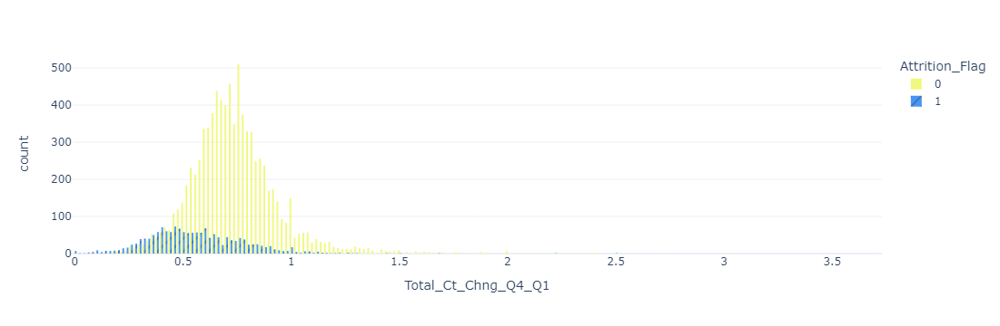

In [487]:
figure = px.histogram(dat, x="Total_Ct_Chng_Q4_Q1", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Avg Utilization Ratio

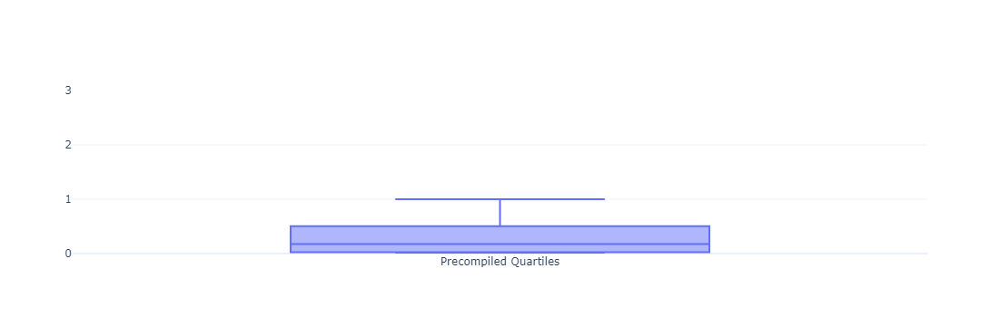

In [488]:
figure = make_subplots(rows=1,cols=1)

figure.add_trace(go.Box(y=dat['Avg_Utilization_Ratio']
      , name="Precompiled Quartiles"))

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,3])
iplot(figure)

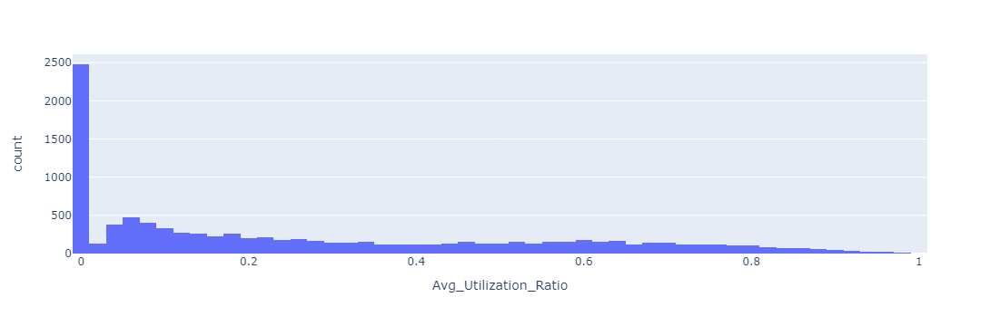

In [489]:
figure = px.histogram(dat, x="Avg_Utilization_Ratio")
figure.show()

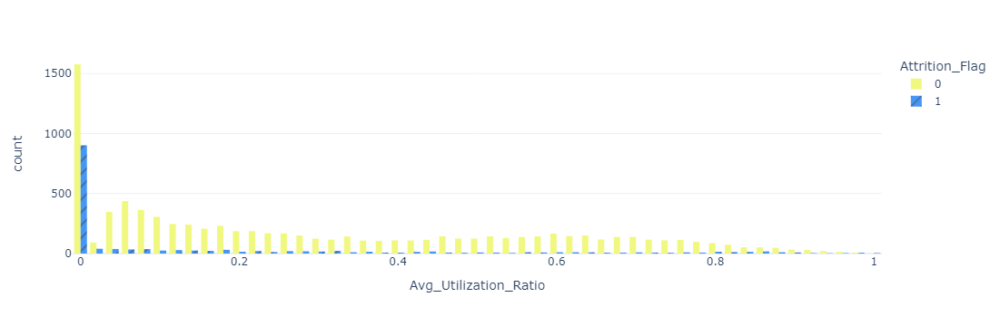

In [490]:
figure = px.histogram(dat, x="Avg_Utilization_Ratio", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

Analysis on Categorical Data

In [491]:
categorical_features = [feature for feature in dat.columns if dat[feature].dtypes == 'O']

print('Number of categorical variables: ', len(categorical_features))
print("\n")
print('Categorical variables column name:',categorical_features)
print("\n")
dat[categorical_features].head()

Number of categorical variables:  5


Categorical variables column name: ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']




,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,M,High School,Married,60K to 80K,Blue
1,F,Graduate,Single,Less than 40K,Blue
2,M,Graduate,Married,80K to 120K,Blue
3,F,High School,Unknown,Less than 40K,Blue
4,M,Uneducated,Married,60K to 80K,Blue


The Gender

In [492]:
dat_nunique = {var: pd.DataFrame(dat['Gender'].value_counts()) 
              for var in {'Gender'}}
multi_table([ dat_nunique['Gender'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Gender,
F,5358
M,4769


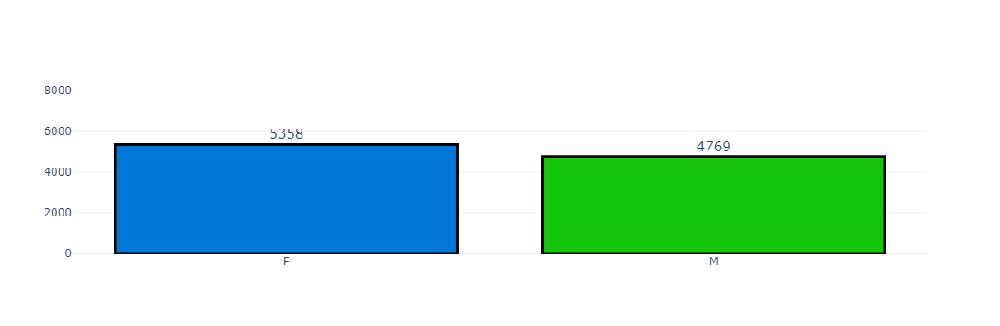

In [493]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Gender'].value_counts().values.tolist(), 
                      x = dat['Gender'].value_counts().index, 
                      text=dat['Gender'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,8000])
iplot(figure)

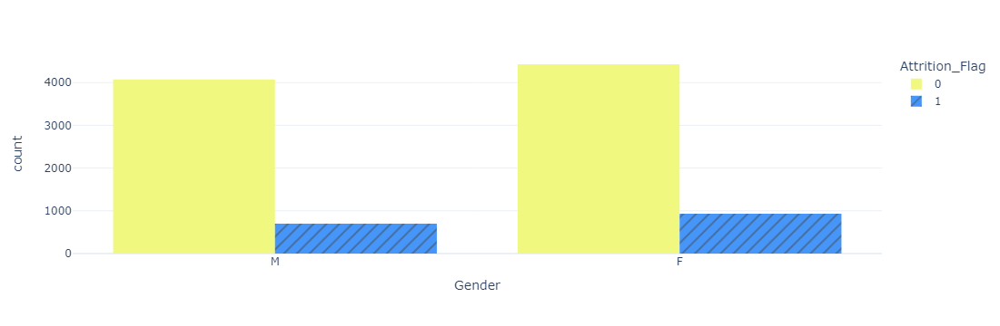

In [494]:
figure = px.histogram(dat, x="Gender", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})


figure.update_layout(bargap=0.2)

figure.show()

The Education Level

In [495]:
dat_nunique = {var: pd.DataFrame(dat['Education_Level'].value_counts()) 
              for var in {'Education_Level'}}
multi_table([ dat_nunique['Education_Level'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Education_Level,
Graduate,3128
High School,2013
Unknown,1519
Uneducated,1487
College,1013
Post-Graduate,516
Doctorate,451


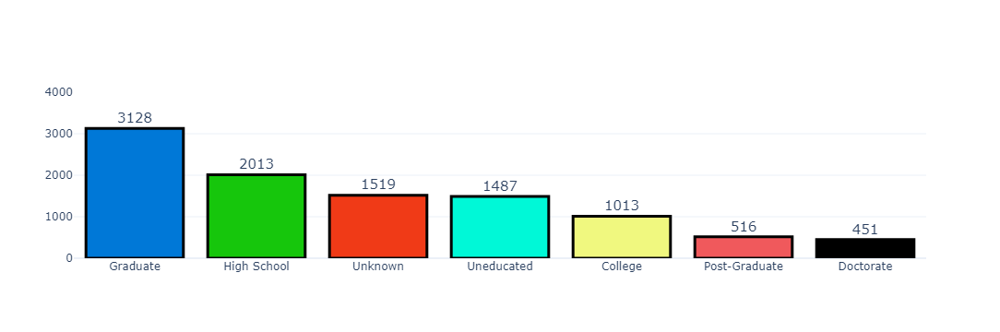

In [496]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Education_Level'].value_counts().values.tolist(), 
                      x = dat['Education_Level'].value_counts().index, 
                      text=dat['Education_Level'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,4000])
iplot(figure)

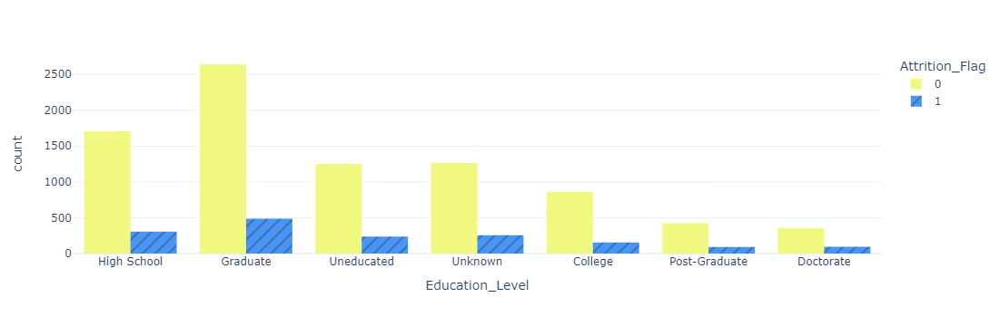

In [497]:
figure = px.histogram(dat, x="Education_Level", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Marital Status

In [498]:
dat_nunique = {var: pd.DataFrame(dat['Marital_Status'].value_counts()) 
              for var in {'Marital_Status'}}
multi_table([ dat_nunique['Marital_Status'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Marital_Status,
Married,4687
Single,3943
Unknown,749
Divorced,748


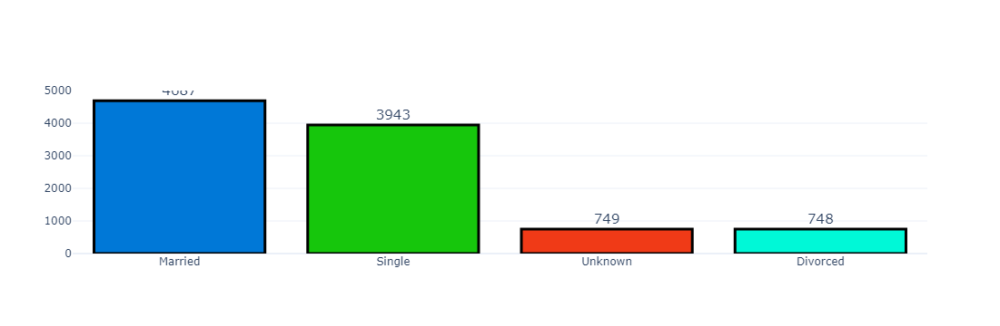

In [499]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Marital_Status'].value_counts().values.tolist(), 
                      x = dat['Marital_Status'].value_counts().index, 
                      text=dat['Marital_Status'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,5000])
iplot(figure)

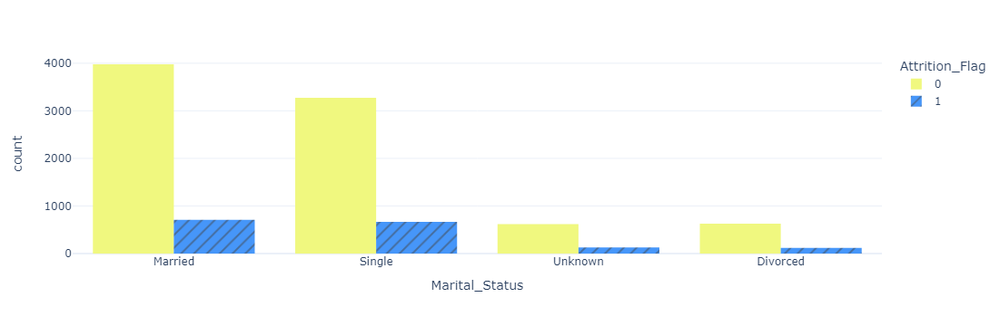

In [500]:
figure = px.histogram(dat, x="Marital_Status", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)

figure.show()

The Income Category

In [501]:
dat_nunique = {var: pd.DataFrame(dat['Income_Category'].value_counts()) 
              for var in {'Income_Category'}}
multi_table([ dat_nunique['Income_Category'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Income_Category,
Less than 40K,3561
40K to 60K,1790
80K to 120K,1535
60K to 80K,1402
Unknown,1112
120K +,727


In [502]:
print(dat['Income_Category'].value_counts().index)

Index(['Less than 40K', '40K to 60K', '80K to 120K', '60K to 80K', 'Unknown',
       '120K +'],
      dtype='object', name='Income_Category')


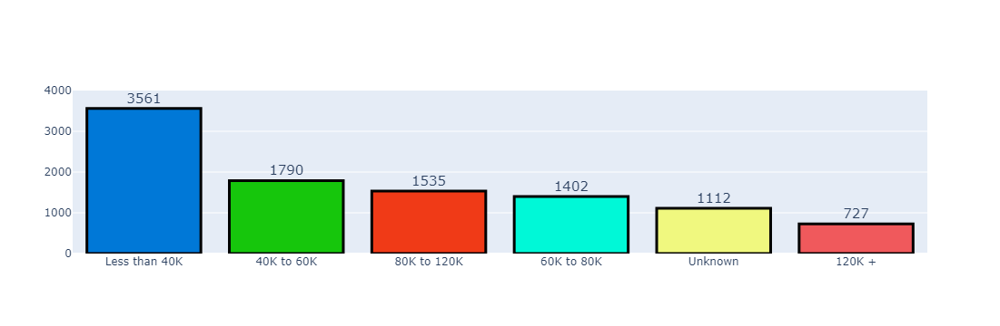

In [503]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Income_Category'].value_counts().values.tolist(), 
                       x = dat['Income_Category'].value_counts().index,
                      text=dat['Income_Category'].value_counts().values.tolist(),
                      textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_yaxes(range=[0,4000])

iplot(figure)

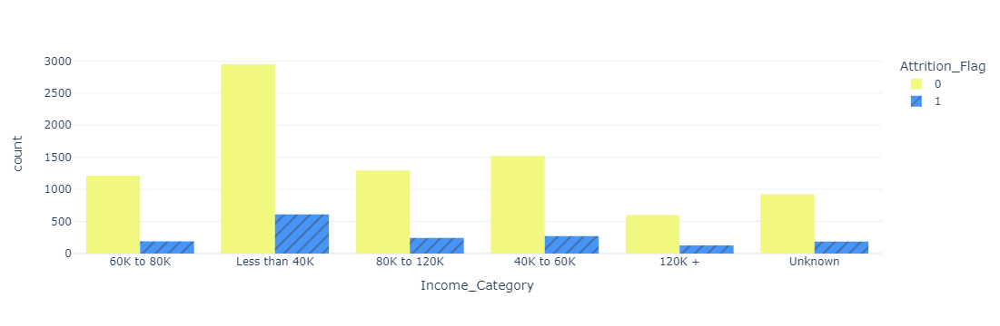

In [504]:
figure = px.histogram(dat,x="Income_Category", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group', color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

figure.update_layout(bargap=0.2)
figure.update_layout(xaxis={'type': 'category'})
figure.show()

The Card Category

In [505]:
dat_nunique = {var: pd.DataFrame(dat['Card_Category'].value_counts()) 
              for var in {'Card_Category'}}
multi_table([ dat_nunique['Card_Category'].style.set_properties(**{"background-color": "black", "color": "white", "border-color": "black", "font-size":"11.5pt","width": 300 })])

,count
Card_Category,
Blue,9436
Silver,555
Gold,116
Platinum,20


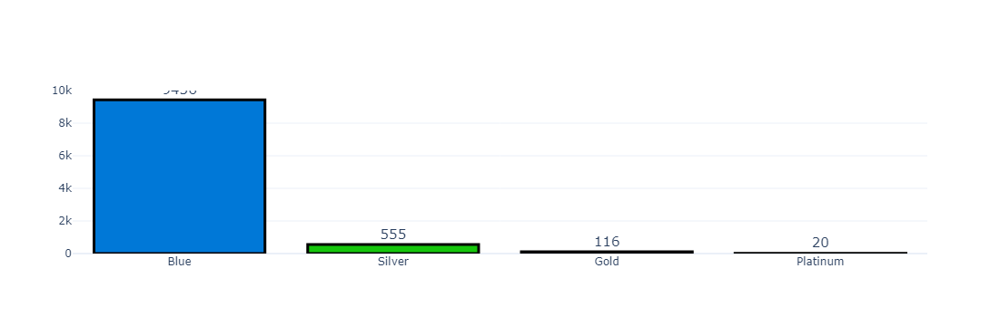

In [506]:
figure = make_subplots(rows=1,cols=1)
Colors = ['#0078d7','#16c60c','#f03a17','#00f8d7','#f0f87f','#f0595c']
figure.add_trace(go.Bar(y = dat['Card_Category'].value_counts().values.tolist(), 
                      x = dat['Card_Category'].value_counts().index, 
                      text=dat['Card_Category'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = Colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)

figure.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
figure.update_yaxes(range=[0,10000])
iplot(figure)

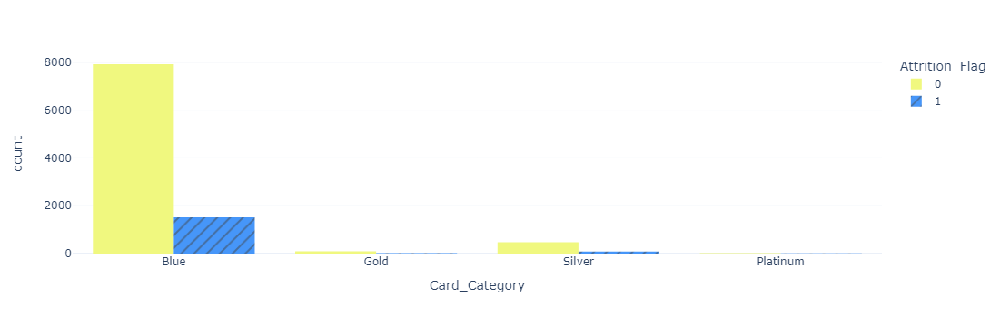

In [507]:
figure = px.histogram(dat, x="Card_Category", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',
                      .)

figure.update_layout(bargap=0.2)

figure.show()

In [508]:
dat.head()

,CLIENTNUM,Attrition_Flag,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2,Age,Bank_Relationship_Period
0,768805383,0,M,3,High School,Married,60K to 80K,Blue,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991,1,3
1,818770008,0,F,5,Graduate,Single,Less than 40K,Blue,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994,2,0
2,713982108,0,M,3,Graduate,Married,80K to 120K,Blue,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998,2,3
3,769911858,0,F,4,High School,Unknown,Less than 40K,Blue,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987,1,3
4,709106358,0,M,3,Uneducated,Married,60K to 80K,Blue,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998,1,2


Encoding The Categorical Features

In [509]:
dat_new=pd.get_dummies(dat, columns=['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'],drop_first=False)
print(dat_new.shape)

(10127, 41)


In [510]:
dat_new.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Dependent_count',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2',
       'Age', 'Bank_Relationship_Period', 'Gender_F', 'Gender_M',
       'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Education_Level_Unknown', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
   

In [511]:
#Rearrangement of the columns......
dat = dat_new[[ 'Dependent_count', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Age', 'Bank_Relationship_Period', 'Gender_F',
       'Gender_M', 'Education_Level_College', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Education_Level_Unknown', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Unknown', 'Income_Category_120K +',
       'Income_Category_40K to 60K', 'Income_Category_60K to 80K',
       'Income_Category_80K to 120K', 'Income_Category_Less than 40K',
       'Income_Category_Unknown', 'Card_Category_Blue', 'Card_Category_Gold',
       'Card_Category_Platinum', 'Card_Category_Silver','Attrition_Flag']]
dat.head()

,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age,Bank_Relationship_Period,Gender_F,Gender_M,Education_Level_College,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_120K +,Income_Category_40K to 60K,Income_Category_60K to 80K,Income_Category_80K to 120K,Income_Category_Less than 40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Attrition_Flag
0,3,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,3,False,True,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,0
1,5,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,2,0,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,0
2,3,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,2,3,False,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,False,0
3,4,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1,3,True,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,True,False,False,False,0
4,3,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1,2,False,True,False,False,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,0


Correlation Between Dependent And Independent Dependent Features

To see which independent feature influences the dependent variable the most

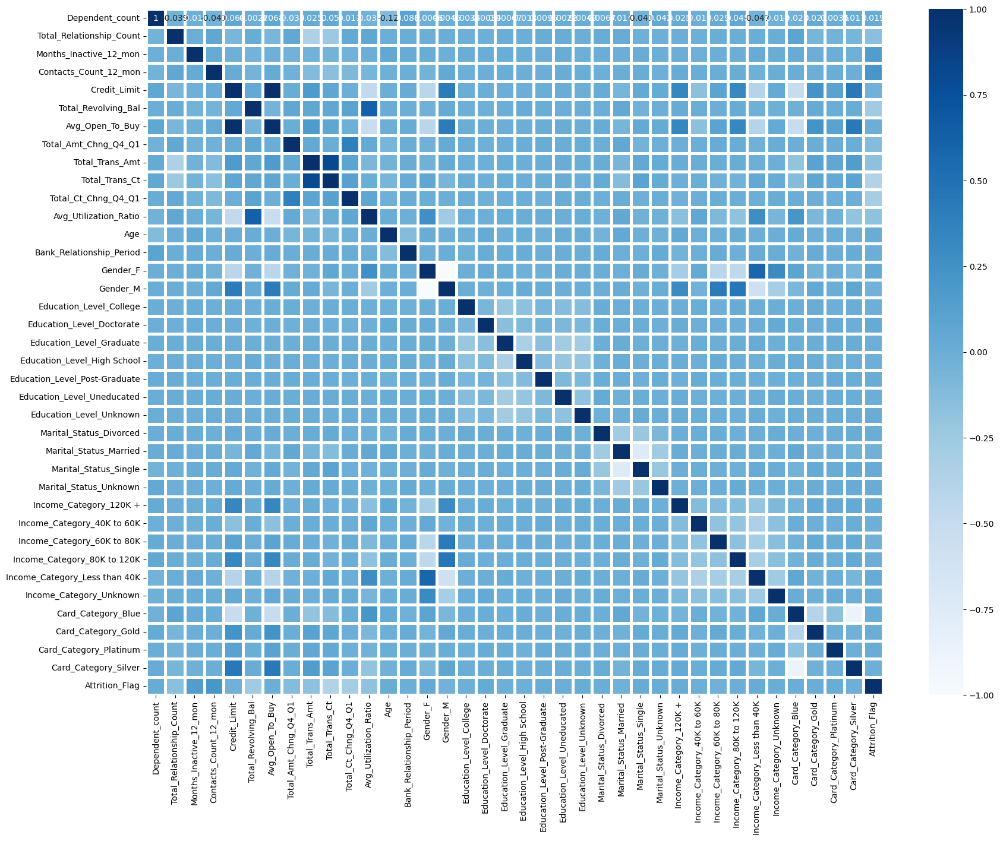

In [512]:
import matplotlib.pyplot as plt
corrmat = dat.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,15))
#plot heat map
import seaborn as sns
g=sns.heatmap(dat[top_corr_features].corr(),annot=True,cmap="Blues",linewidths=3.5,
    linecolor='white')

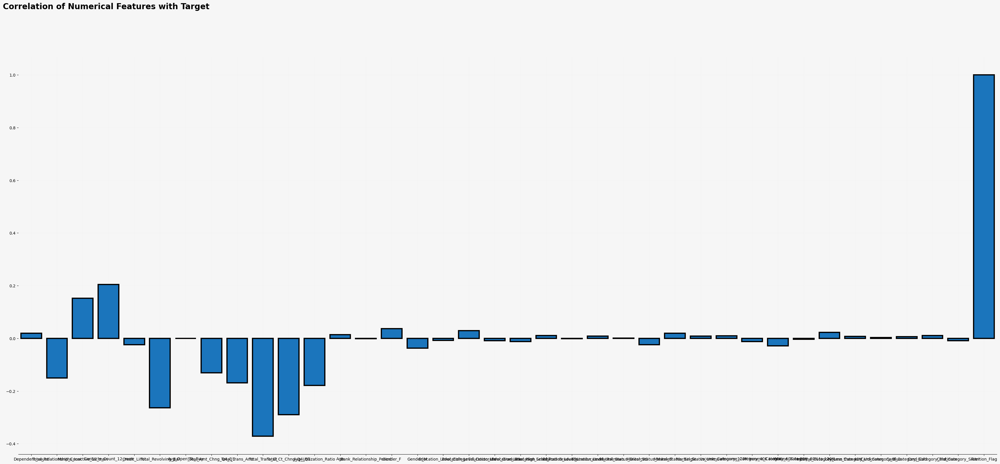

In [513]:
import matplotlib
background_color = "#f6f6f6"
fig = plt.figure(figsize=(44,18), facecolor=background_color)
gs = fig.add_gridspec(1, 1)
ax0 = fig.add_subplot(gs[0, 0])
colors = ["#0078d7"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

ax0.set_facecolor(background_color)
ax0.text(-1.1, 1.25, 'Correlation of Numerical Features with Target', fontsize=20, fontweight='bold')

chart_dat = pd.DataFrame(dat.corrwith(dat['Attrition_Flag']))
chart_dat.columns = ['corr']
sns.barplot(x=chart_dat.index, y=chart_dat['corr'], ax=ax0, color='#0078d7', zorder=3, edgecolor='black', linewidth=3)
ax0.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0.set_ylabel('')
for s in ["top","right", 'left']:
    ax0.spines[s].set_visible(False)

plt.show()

Scaling the dataset

In [514]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit_transform(dat.drop('Attrition_Flag',axis=1))
scaled_features = scaler.transform(dat.drop('Attrition_Flag',axis=1))

In [515]:
scaled_features = pd.DataFrame(scaled_features, columns = dat.columns[:-1])
scaled_features.head()

,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age,Bank_Relationship_Period,Gender_F,Gender_M,Education_Level_College,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_120K +,Income_Category_40K to 60K,Income_Category_60K to 80K,Income_Category_80K to 120K,Income_Category_Less than 40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0.6,0.8,0.166667,0.500000,0.340190,0.308701,0.345116,0.392994,0.035273,0.248062,0.437534,0.061061,0.25,0.75,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,1.0,0.166667,0.333333,0.206112,0.343266,0.214093,0.453636,0.043452,0.178295,1.000000,0.105105,0.50,0.00,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.6,0.6,0.166667,0.000000,0.059850,0.000000,0.098948,0.763615,0.076611,0.077519,0.628164,0.000000,0.50,0.75,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.8,0.4,0.666667,0.166667,0.056676,1.000000,0.022977,0.413600,0.036775,0.077519,0.628164,0.760761,0.25,0.75,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,0.6,0.8,0.166667,0.000000,0.099091,0.000000,0.136557,0.640271,0.017025,0.139535,0.673129,0.000000,0.25,0.50,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [516]:
X = scaled_features
y = dat['Attrition_Flag']

Split The Features Into Training & Into Testing Dataset

In [517]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.30,random_state = 0)

Visualize Model Score

In [518]:
from sklearn.ensemble import RandomForestClassifier ,AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve ,KFold
from sklearn.metrics import roc_curve,accuracy_score,f1_score,auc,confusion_matrix,roc_auc_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.tree import DecisionTreeClassifier


   CrossVal_Score_Means  CrossValerrors                    Algo
0              0.954430        0.006555  RandomForestClassifier
1              0.962613        0.006193      AdaBoostClassifier
2              0.954430        0.006180       Gradient Boosting
3              0.927624        0.005426    ExtraTreesClassifier
4              0.934396        0.008823  DecisionTreeClassifier


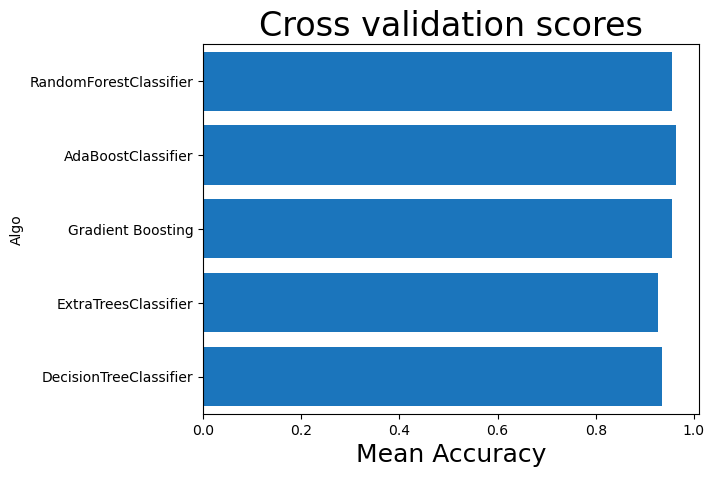

<Figure size 1200x800 with 0 Axes>

In [519]:
kfold = StratifiedKFold(n_splits=8,shuffle=True, random_state=42)


rs = 15
clrs = []

clrs.append(AdaBoostClassifier(random_state=rs))
clrs.append(GradientBoostingClassifier(random_state=rs))
clrs.append(RandomForestClassifier(random_state=rs))
clrs.append(ExtraTreesClassifier(random_state = rs))
clrs.append(DecisionTreeClassifier(random_state = rs))

cv_results = []
for clr in clrs :
    cv_results.append(cross_val_score(clr, X_train, y_train , scoring = 'accuracy', cv = kfold, n_jobs=-1))

cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())
    
cv_df = pd.DataFrame({"CrossVal_Score_Means":cv_means,"CrossValerrors": cv_std,"Algo":["RandomForestClassifier","AdaBoostClassifier","Gradient Boosting",'ExtraTreesClassifier','DecisionTreeClassifier']})
#g = sns.barplot("CrossVal_Score_Means","Algo",data = cv_df,orient = "h",**{'xerr':cv_std},color = '#0078d7')
g = sns.barplot(x="CrossVal_Score_Means", y="Algo", data=cv_df, orient="h", color='#0078d7')
g.set_xlabel("Mean Accuracy",fontsize = 18)
g = g.set_title("Cross validation scores",fontsize = 24)
plt.figure(figsize = (12,8))
print(cv_df)

In [520]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
y_pred = dtc.predict(X_test)

In [521]:
confusion_matrix(y_test, y_pred)

array([[2478,  105],
       [  93,  363]], dtype=int64)

In [522]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2583
           1       0.78      0.80      0.79       456

    accuracy                           0.93      3039
   macro avg       0.87      0.88      0.87      3039
weighted avg       0.94      0.93      0.94      3039



In [523]:
print(accuracy_score(y_test, y_pred))

0.9348469891411648


Hyper Parameter Tunning

In [524]:
from sklearn.model_selection import GridSearchCV
grid_params = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(2, 10, 1)
}

grid_search = GridSearchCV(dtc, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 512 candidates, totalling 2560 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10)},
             verbose=1)

In [525]:
dtc = grid_search.best_estimator_
y_pred = dtc.predict(X_test)  

In [526]:
print(accuracy_score(y_test, y_pred))

0.9480092135570911


In [527]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 8, 'min_samples_split': 4}
0.9452595075115487


Checking The Best Estimators

In [528]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
ada = AdaBoostClassifier()

parameters = {
    'n_estimators' : [50, 70, 90, 120, 180, 200],
    'learning_rate' : [0.001, 0.01, 0.1, 1, 10],
    'algorithm' : ['SAMME', 'SAMME.R']
}

grid_search = GridSearchCV(ada, parameters, n_jobs = -1, cv = 10, verbose = 1)
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 60 candidates, totalling 600 fits


C:\Users\vikky\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



GridSearchCV(cv=10, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'n_estimators': [50, 70, 90, 120, 180, 200]},
             verbose=1)

In [529]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'algorithm': 'SAMME.R', 'learning_rate': 1, 'n_estimators': 90}
0.9590861641685192


Train The Model With Best Hyper Parameters

In [530]:
from sklearn.ensemble import AdaBoostClassifier
ada = AdaBoostClassifier(algorithm = 'SAMME', learning_rate = 1, n_estimators = 120)
ada.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', learning_rate=1, n_estimators=120)

Confusion Matrix

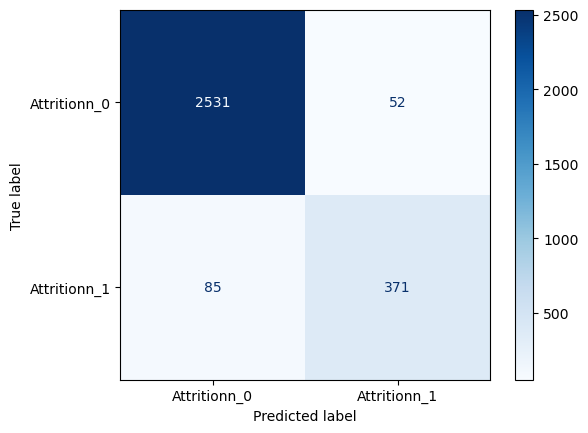

In [531]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred = ada.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=['Attritionn_0', 'Attritionn_1'])
disp.plot(cmap=plt.cm.Blues)
plt.grid(False)
plt.show()

In [532]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      2583
           1       0.88      0.81      0.84       456

    accuracy                           0.95      3039
   macro avg       0.92      0.90      0.91      3039
weighted avg       0.95      0.95      0.95      3039



In [533]:
print(accuracy_score(y_test, y_pred))

0.9549193813754524


Feature Importance

In [534]:
feature = pd.Series(ada.feature_importances_, index = X_train.columns).sort_values(ascending = False)
print(feature)

Total_Trans_Amt                  0.320395
Total_Trans_Ct                   0.287492
Total_Amt_Chng_Q4_Q1             0.105448
Total_Revolving_Bal              0.077102
Contacts_Count_12_mon            0.066802
Total_Ct_Chng_Q4_Q1              0.057453
Total_Relationship_Count         0.034665
Months_Inactive_12_mon           0.032320
Avg_Open_To_Buy                  0.006260
Age                              0.006058
Credit_Limit                     0.006005
Income_Category_80K to 120K      0.000000
Marital_Status_Unknown           0.000000
Income_Category_120K +           0.000000
Income_Category_40K to 60K       0.000000
Income_Category_60K to 80K       0.000000
Dependent_count                  0.000000
Income_Category_Less than 40K    0.000000
Income_Category_Unknown          0.000000
Card_Category_Blue               0.000000
Card_Category_Gold               0.000000
Marital_Status_Married           0.000000
Card_Category_Platinum           0.000000
Marital_Status_Single            0

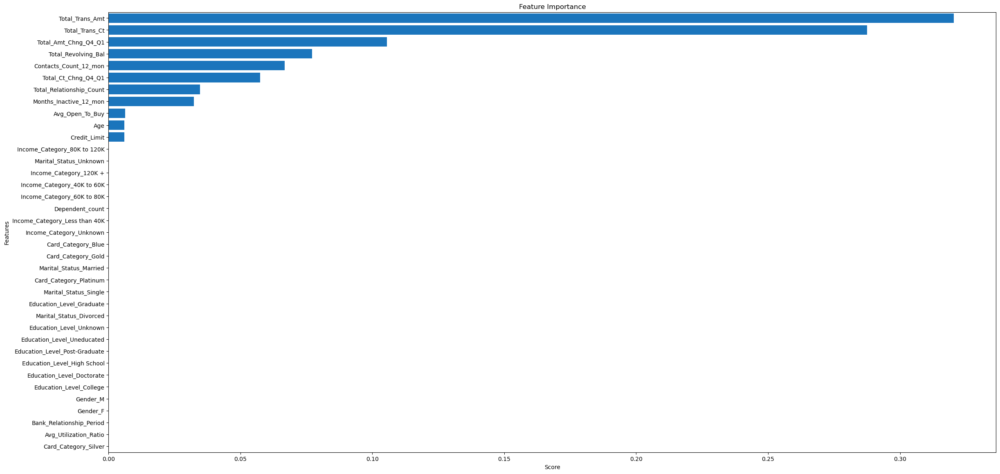

In [535]:
plt.figure(figsize = (28,14))
sns.barplot(x = feature, y = feature.index,color = '#0078d7')
plt.title("Feature Importance")
plt.xlabel('Score')
plt.ylabel('Features')
plt.show()

CONCLUSION:

1. Total no.of churned customer are 16.07%
2. Proportion of Gender count distribution is equal - men 47.1%, female 52.9%. Existing and Churned customer are 83.85% , 16.06%.
3. The proportion of attrited customer by gender there are 14.36% more female than male who have churned.
4. Customer's who churned out,proportion made on educational level churned customer is graduated level - 29.9% followed by Post-graduate level - 18.8%.
5. Marital Status churned customer proportion, Married - 43.6% , Single - 41.1%, Divorced-7.4% and Unkown- 7.9%. The churned proportion of Marital Status is mixed with Married and Single.
6. As you can see from the proportion of income category of attrited customer, it is highly concentrated around 
60 to −80K income (37.6%), followed by Less than 40K income(16.%),7120K + (11.5%). I assume that customers with higher income doesn't likely to leave their credit card services than meddle-income customer.
   